In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc

In [2]:
mc_df = pd.read_csv("bulk/music_wctrl/proportions_0.25_correlation_wBM.tsv",sep="\t",index_col=0)

In [3]:
sc_meta = pd.read_csv("scRNA/adata_clustered_wctrl_harm_cluster_merged_meta_redo.tsv",sep="\t",index_col=0)

In [4]:
sc_meta

,sample,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,n_genes,n_counts,doublet_score,predicted_doublet,leiden_4,...,leiden_3,leiden_0.5,leiden_0.25,leiden_0.75,leiden,CellID,merged_clusters,final_clustering,final_clustering_reset,merged_clusters_from_4
AAACAGCCAAGTCGCT-1,iPSC_prepat_d5_1,3565,8014.0,450.0,5.615173,3565,8014.0,0.006024,False,12,...,18,7,6,7,8,AAACAGCCAAGTCGCT-1,33,7,33,33
AAACAGCCACATTGCA-1,iPSC_prepat_d5_1,4708,17233.0,995.0,5.773806,4708,17233.0,0.012519,False,2,...,5,5,8,13,11,AAACAGCCACATTGCA-1,15,30,15,15
AAACAGCCAGCATGTC-1,iPSC_prepat_d5_1,4852,13375.0,911.0,6.811215,4852,13375.0,0.025396,False,31,...,31,6,2,3,3,AAACAGCCAGCATGTC-1,29,31,29,29
AAACAGCCATTCCTGT-1,iPSC_prepat_d5_1,8300,41629.0,2428.0,5.832472,8300,41629.0,0.051796,False,40,...,17,0,0,12,4,AAACAGCCATTCCTGT-1,5,11,5,5
AAACAGCCATTTAAGC-1,iPSC_prepat_d5_1,4603,11184.0,537.0,4.801502,4603,11184.0,0.063149,False,15,...,8,5,2,8,3,AAACAGCCATTTAAGC-1,4,22,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCTAGAACAAGT-1,iPSC_ctrl,3362,6340.0,583.0,9.195583,3362,6340.0,0.018604,False,6,...,0,1,3,0,0,TTTGTCTAGAACAAGT-1,0,13,0,0
TTTGTGAAGCCTGTTC-1,iPSC_ctrl,3205,5841.0,495.0,8.474577,3205,5841.0,0.015185,False,34,...,1,1,3,0,0,TTTGTGAAGCCTGTTC-1,0,13,0,0
TTTGTGAAGTTGGGCC-1,iPSC_ctrl,2111,3282.0,0.0,0.000000,2111,3282.0,0.011972,False,4,...,6,1,3,14,13,TTTGTGAAGTTGGGCC-1,28,28,28,28
TTTGTGTTCCGCCTAT-1,iPSC_ctrl,2382,3776.0,285.0,7.547670,2382,3776.0,0.015504,False,0,...,1,1,3,0,12,TTTGTGTTCCGCCTAT-1,0,13,0,0


In [5]:
clusters = list(set(sc_meta['merged_clusters_from_4']))

In [6]:
morphogen_bm = ['M_XAV','M_CHIR','M_RA','M_FGF8','M_BMP4','M_SHH','M_CycA','M_NIM','M_N2B27_2Si','M_N2B27_SB_CHIR']
cluster_morph_correlation = pd.DataFrame(index=clusters,columns=morphogen_bm)

for cluster in clusters:
    a = sc_meta.loc[sc_meta['merged_clusters_from_4']==cluster,'leiden_0.25'].value_counts()
    
    for morphogen in morphogen_bm:
        w = 0
        cells_used = 0
        for cl in a.index:
            if str(cl) in mc_df.index:
                w = a[cl]*mc_df.loc[str(cl),morphogen] + w
                cells_used = cells_used + a[cl]
        if cells_used==0:
            w=0
        else:
            w = w/cells_used
        sc_meta.loc[sc_meta['merged_clusters_from_4']==cluster,morphogen] = w
        cluster_morph_correlation.loc[cluster,morphogen] = w

In [7]:
cluster_morph_correlation.loc[31].sort_values()

M_NIM             -0.213021
M_N2B27_2Si       -0.200921
M_XAV             -0.163108
M_CHIR             -0.14494
M_CycA            -0.104183
M_RA              -0.069392
M_SHH              0.077493
M_FGF8             0.094161
M_BMP4             0.155526
M_N2B27_SB_CHIR    0.462801
Name: 31, dtype: object

In [8]:
cluster_morph_correlation.to_csv("bulk/music_wctrl/proportions_0.25_correlation_wBM_merged_clusters_from_4_redo.tsv",sep="\t")

In [9]:
print(list(mc_df.columns))

['M_XAV', 'M_CHIR', 'M_RA', 'M_FGF8', 'M_BMP4', 'M_SHH', 'M_PM', 'M_CycA', 'M_NIM', 'M_N2B27_2Si', 'M_N2B27_SB_CHIR', '5', '8', '6', '2', '4', '9', '0', '7', '1']


In [10]:
import numpy as np
def cluster_avg(adata,clustering):
    cluster_avg_subset = pd.DataFrame(columns=adata.var_names, index=adata.obs[clustering].cat.categories)                                                                                                 
    for clust in adata.obs[clustering].cat.categories: 
        cluster_avg_subset.loc[clust] = adata[adata.obs[clustering].isin([clust]),:].X.mean(0)


    cluster_avg_subset = cluster_avg_subset.astype('float')
    cluster_avg_subset = cluster_avg_subset.T
    return(cluster_avg_subset)

def find_TF_NES(me_df,TF):
    me_df_subset = me_df[['Direct_annot','NES']].copy()
    me_df_subset = me_df_subset.dropna()
    # Split the strings into lists
    me_df_subset['Direct_annot_list'] = me_df_subset['Direct_annot'].str.split(', ')

    # Use apply with a lambda function to check if the string is present in each list
    me_df_filtered = me_df_subset[me_df_subset['Direct_annot_list'].apply(lambda x: TF in x)]

    max_NES = me_df_filtered['NES'].max()
    if len(me_df_filtered)>0:
        TF_motif = me_df_filtered['NES'].idxmax()
    else:
        TF_motif = max_NES
    return(max_NES,TF_motif)

In [11]:
import dill
menr = dill.load(open('motifs_redo_vs_control/menr.pkl', 'rb'))

In [12]:
HG_TFS_FNAME = '/home/jjanssens/jjans/resources/resources.aertslab.org/cistarget/tf_lists/allTFs_hg38.txt'
HG_TFs = pd.read_csv(HG_TFS_FNAME,sep="\t",header=None)
HG_TFs = list(HG_TFs[0])
HG_TFs1 = HG_TFs.copy()

HG_TFS_FNAME = '/home/jjanssens/jjans/resources/geneLists/human_TFs/utoronto_human_tfs_v_1.01.txt'
HG_TFs = pd.read_csv(HG_TFS_FNAME,sep="\t",header=None)
HG_TFs = list(HG_TFs[0])
HG_TFs2 = HG_TFs.copy()

HG_TFs = HG_TFs1 + HG_TFs2
HG_TFs = list(sorted(set(HG_TFs)))

In [14]:
menr.keys()

dict_keys(['CTX_DARs_up_All', 'CTX_DARs_up_No_promoters', 'DEM_DARs_up_All', 'DEM_DARs_up_No_promoters', 'CTX_DARs_dw_All', 'CTX_DARs_dw_No_promoters', 'DEM_DARs_dw_All', 'DEM_DARs_dw_No_promoters'])

In [15]:
me_celltypes = list(menr['CTX_DARs_up_All'].keys())
print(len(me_celltypes))

33


In [16]:
work_dir = ''
import os
import pickle
region_bin_topics_otsu = pickle.load(open(os.path.join(work_dir, 'scATAC/candidate_enhancers/region_bin_topics_otsu.pkl'), 'rb'))
region_bin_topics_top3k = pickle.load(open(os.path.join(work_dir, 'scATAC/candidate_enhancers/region_bin_topics_top3k.pkl'), 'rb'))
markers_dict = pickle.load(open(os.path.join(work_dir, 'scATAC/candidate_enhancers/markers_dict_redo.pkl'), 'rb'))

In [17]:
adata = sc.read_h5ad("scRNA/adata_clustered_wctrl_harm_cluster_merged_redo.h5ad")
adata2 = sc.read_h5ad("scRNA/adata_clustered_wctrl_harm_cluster_redo.h5ad")

In [18]:
adata.obsm = adata2.obsm
adata.obsp = adata2.obsp
adata.obs['final_clustering'] = adata.obs['merged_clusters_from_4']

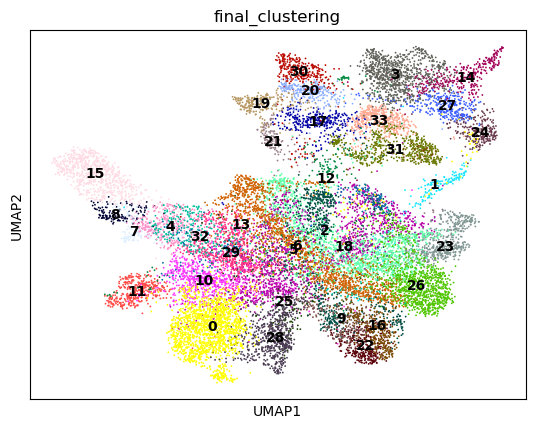

In [19]:
sc.pl.umap(adata,color=['final_clustering'],legend_loc='on data')

In [20]:
#preprocess adata
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [21]:
cluster_avg_subset = cluster_avg(adata,'final_clustering')

In [22]:
selected_TFs = ['PAX6','OTX2','GRHL2']
selected_TFs = [x for x in selected_TFs if x in cluster_avg_subset.index]
    

In [23]:
cluster_avg_subset_minmax = (cluster_avg_subset.T-cluster_avg_subset.T.min())/(cluster_avg_subset.T.max()-cluster_avg_subset.T.min())
cluster_avg_subset_minmax = cluster_avg_subset_minmax.T
cluster_avg_subset_minmax = cluster_avg_subset_minmax.dropna()

selected_TFs = [x for x in HG_TFs if x in cluster_avg_subset_minmax.index]
print(len(selected_TFs))

2038


In [24]:
me_celltypes = list(menr['CTX_DARs_up_All'].keys())
rna_celltypes = list(cluster_avg_subset.columns)
common_celltypes = [x for x in me_celltypes if x in rna_celltypes]
print(len(common_celltypes))

32


In [25]:
from tqdm.notebook import tqdm

In [26]:
tf_me_summary = []
for gene in tqdm(selected_TFs):
    for celltype in common_celltypes:
        me_obj = menr['CTX_DARs_up_All'][celltype]
        me_df = me_obj.motif_enrichment
        mnes,TF_motif = find_TF_NES(me_df,gene)
        
        rna_expr = cluster_avg_subset_minmax.loc[gene,celltype]
        
        tf_me_summary.append(dict(celltype=celltype,gene=gene,
                                  mnes=mnes,TF_motif=TF_motif,
                                  rna_expr=rna_expr))
tf_me_summary = pd.DataFrame(tf_me_summary)

  0%|          | 0/2038 [00:00<?, ?it/s]

In [27]:
tf_me_summary = tf_me_summary.fillna(0)

In [28]:
tf_me_summary_max = tf_me_summary.groupby('gene').max()
TFs_use = list(tf_me_summary_max.loc[tf_me_summary_max['mnes']>0].index)

/tmp/ipykernel_50199/537139083.py:1: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  tf_me_summary_max = tf_me_summary.groupby('gene').max()


In [29]:
tf_me_summary_max

,celltype,mnes,rna_expr
gene,,,
A1CF,9,0.0,1.0
ABCF2,9,0.0,1.0
ABL1,9,0.0,1.0
AC008770.3,9,0.0,1.0
AC023509.3,9,0.0,1.0
...,...,...,...
ZSCAN9,9,0.0,1.0
ZSWIM1,9,0.0,1.0
ZXDA,9,0.0,1.0


In [30]:
tf_me_summary_max = tf_me_summary.sort_values(by='mnes',ascending=False).groupby('gene').head(n=1)
TFs_use2 = list(tf_me_summary_max.loc[tf_me_summary_max['mnes']>0]['gene'])

In [31]:
tf_corr_summary = []
for gene in TFs_use:
    tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==gene]
    import scipy
    tf_top_motif = list(tf_me_summary_gene.sort_values(by='mnes',ascending=False)['TF_motif'])[0]
    a = tf_me_summary_gene['mnes']
    b = tf_me_summary_gene['rna_expr']
    r_spearman,p_spearman = scipy.stats.spearmanr(a,b)
    r_pearson,p_pearson = scipy.stats.pearsonr(a,b)
    
    tf_corr_summary.append(dict(gene=gene,
                                r_spearman=r_spearman,p_spearman=p_spearman,
                                r_pearson=r_pearson,p_pearson=p_pearson,
                               tf_top_motif = tf_top_motif))
tf_corr_summary = pd.DataFrame(tf_corr_summary)

/links/groups/treutlein/USERS/jjans/anaconda3/envs/scenicplus/lib/python3.8/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/links/groups/treutlein/USERS/jjans/anaconda3/envs/scenicplus/lib/python3.8/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


In [32]:
tf_corr_summary_sig = tf_corr_summary.loc[tf_corr_summary['p_spearman']<0.05]

In [33]:
neg_corr = list(tf_corr_summary_sig.sort_values(by='r_spearman')['gene'][0:10])
pos_corr = list(tf_corr_summary_sig.sort_values(by='r_spearman',ascending=False)['gene'][0:10])

In [34]:
tf_me_summary.to_csv("cistromes/tf_me_summary_DARs_vs_ctrl.tsv",sep="\t")
tf_corr_summary.to_csv("cistromes/tf_corr_summary_DARs_vs_ctrl.tsv",sep="\t")

In [35]:
tf_corr_summary.loc[tf_corr_summary['gene']=='TEAD2']

,gene,r_spearman,p_spearman,r_pearson,p_pearson,tf_top_motif
367,TEAD2,-0.089887,0.624672,-0.082977,0.651635,metacluster_171.3


In [32]:
tf_corr_summary.loc[tf_corr_summary['gene'].isin(['SNAI2','FOXA2','FOXG1','RFX4'])]

,gene,r_spearman,p_spearman,r_pearson,p_pearson,tf_top_motif
82,FOXA2,0.623461,1.061888e-04,0.952048,1.689829e-17,metacluster_127.1
93,FOXG1,-0.326301,6.384315e-02,-0.155173,3.885373e-01,metacluster_134.3
343,RFX4,0.792947,3.763710e-08,0.905322,4.618150e-13,metacluster_136.3
373,SNAI2,-0.614088,1.439924e-04,-0.201229,2.614653e-01,metacluster_176.2


In [36]:
tf_me_summary

,celltype,gene,mnes,TF_motif,rna_expr
0,0,A1CF,0.0,0,0.011855
1,10,A1CF,0.0,0,0.054929
2,11,A1CF,0.0,0,0.079963
3,12,A1CF,0.0,0,0.176559
4,13,A1CF,0.0,0,0.000000
...,...,...,...,...,...
67249,5,ZXDC,0.0,0,0.800417
67250,6,ZXDC,0.0,0,0.618400
67251,7,ZXDC,0.0,0,0.267231
67252,8,ZXDC,0.0,0,0.399627


In [34]:
tf_corr_summary.loc[tf_corr_summary['gene']=='TEAD2']

,gene,r_spearman,p_spearman,r_pearson,p_pearson,tf_top_motif
419,TEAD2,-0.018222,0.919828,-0.022964,0.899059,metacluster_171.3


In [33]:
tf_corr_summary.loc[tf_corr_summary['gene']=='TEAD2']

,gene,r_spearman,p_spearman,r_pearson,p_pearson,tf_top_motif
419,TEAD2,-0.018222,0.919828,-0.022964,0.899059,metacluster_171.3


In [35]:
tf_corr_summary.loc[tf_corr_summary['gene']=='NEUROG2']

,gene,r_spearman,p_spearman,r_pearson,p_pearson,tf_top_motif
261,NEUROG2,0.297069,0.093177,0.704857,0.000005,metacluster_43.1


In [27]:
tf_corr_summary.loc[tf_corr_summary['gene']=='NEUROG2']

,gene,r_spearman,p_spearman,r_pearson,p_pearson,tf_top_motif
261,NEUROG2,0.297069,0.093177,0.704857,0.000005,metacluster_43.1


In [22]:
tf_corr_summary.loc[tf_corr_summary['gene']=='NEUROG2']

,gene,r_spearman,p_spearman,r_pearson,p_pearson,tf_top_motif
278,NEUROG2,0.250007,0.090105,0.703901,3.398400e-08,metacluster_43.1


In [32]:
tf_corr_summary.loc[tf_corr_summary['gene']=='GRHL2']

,gene,r_spearman,p_spearman,r_pearson,p_pearson,tf_top_motif
122,GRHL2,0.726669,0.000002,0.922374,2.399949e-14,metacluster_123.2


In [55]:
menr['CTX_DARs_All'].keys()

dict_keys(['0', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '3', '30', '31', '32', '33', '4', '5', '6', '7', '8', '9', 'unknown'])

In [33]:
TF = 'FOXG1'
TF_motif_name = list(tf_corr_summary.loc[tf_corr_summary['gene']==TF,'tf_top_motif'])[0]
url = 'https://motifcollections.aertslab.org/v10nr_clust/logos/'+TF_motif_name+'.png'
print(url)

https://motifcollections.aertslab.org/v10nr_clust/logos/metacluster_134.3.png


In [34]:
tf_corr_summary

,gene,r_spearman,p_spearman,r_pearson,p_pearson,tf_top_motif
0,ABL1,0.018565,0.918323,0.004164,0.981651,transfac_pro__M08187
1,AFF4,-0.285184,0.107683,-0.292910,0.098073,hdpi__AFF4
2,AHDC1,-0.384575,0.027119,-0.264710,0.136563,metacluster_134.4
3,ALX1,-0.252391,0.156474,-0.268683,0.130557,metacluster_9.24
4,ALX3,0.031576,0.861522,-0.053890,0.765815,metacluster_150.6
...,...,...,...,...,...,...
521,ZNF843,0.107242,0.552499,0.139718,0.438051,metacluster_1.9
522,ZNF875,-0.334206,0.057314,-0.475732,0.005138,metacluster_24.4
523,ZNF880,-0.481691,0.004535,-0.476259,0.005083,metacluster_133.2
524,ZNF90,0.129957,0.471017,0.110174,0.541624,kznf__ZNF90_Imbeault2017_OM_RCADE


In [35]:
for region_set in ['CTX_DARs_All', 'CTX_DARs_No_promoters']:
    region_set_ME = menr[region_set]
    for cluster in region_set_ME.keys():
        region_set_ME_cluster = region_set_ME[cluster]
        NEUROG2_cistromes = [x for x in region_set_ME_cluster.cistromes['Region_set'].keys() if 'NEUROG2' in x]
        if len(NEUROG2_cistromes)>0:
            print(cluster)

14
14


In [58]:
tf_corr_summary.loc[tf_corr_summary['gene']=='NEUROG2']

,gene,r_spearman,p_spearman,r_pearson,p_pearson,tf_top_motif
261,NEUROG2,0.297069,0.093177,0.704857,0.000005,metacluster_43.1


In [37]:
cluster_morph_correlation.index = [str(x) for x in cluster_morph_correlation.index]

In [38]:
tf_me_summary['C_RA'] = list(cluster_morph_correlation.loc[tf_me_summary['celltype'],'M_RA'])
tf_me_summary['C_BMP4'] = list(cluster_morph_correlation.loc[tf_me_summary['celltype'],'M_BMP4'])
tf_me_summary['C_SHH'] = list(cluster_morph_correlation.loc[tf_me_summary['celltype'],'M_SHH'])
tf_me_summary['C_XAV'] = list(cluster_morph_correlation.loc[tf_me_summary['celltype'],'M_XAV'])
tf_me_summary['C_CHIR'] = list(cluster_morph_correlation.loc[tf_me_summary['celltype'],'M_CHIR'])
tf_me_summary['C_FGF8'] = list(cluster_morph_correlation.loc[tf_me_summary['celltype'],'M_FGF8'])

tf_me_summary['M_N2B27_SB_CHIR'] = list(cluster_morph_correlation.loc[tf_me_summary['celltype'],'M_N2B27_SB_CHIR'])
tf_me_summary['M_NIM'] = list(cluster_morph_correlation.loc[tf_me_summary['celltype'],'M_NIM'])
tf_me_summary['M_N2B27_2Si'] = list(cluster_morph_correlation.loc[tf_me_summary['celltype'],'M_N2B27_2Si'])

tf_me_summary = tf_me_summary.fillna(0)

In [49]:
tf_me_summary.loc[tf_me_summary['gene']=='RARB'].corr()['rna_expr'].sort_values(ascending=False)

/tmp/ipykernel_57553/3915006374.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  tf_me_summary.loc[tf_me_summary['gene']=='RARB'].corr()['rna_expr'].sort_values(ascending=False)


rna_expr           1.000000
C_RA               0.551389
M_N2B27_SB_CHIR    0.400144
C_BMP4             0.064290
C_SHH              0.033942
C_FGF8            -0.124897
M_NIM             -0.172284
C_XAV             -0.261905
mnes              -0.271834
C_CHIR            -0.454590
M_N2B27_2Si       -0.462816
Name: rna_expr, dtype: float64

In [50]:
tf_me_summary.loc[tf_me_summary['gene']=='SMAD9'].corr()['rna_expr'].sort_values(ascending=False)

/tmp/ipykernel_57553/1112061758.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  tf_me_summary.loc[tf_me_summary['gene']=='SMAD9'].corr()['rna_expr'].sort_values(ascending=False)


rna_expr           1.000000
C_BMP4             0.430394
M_NIM              0.410868
C_XAV              0.334044
C_FGF8             0.049931
C_RA              -0.129669
C_CHIR            -0.173588
M_N2B27_2Si       -0.182033
M_N2B27_SB_CHIR   -0.186688
C_SHH             -0.406457
mnes                    NaN
Name: rna_expr, dtype: float64

In [39]:
tf_me_summary.sort_values(by='C_RA')

,celltype,gene,mnes,TF_motif,rna_expr,C_RA,C_BMP4,C_SHH,C_XAV,C_CHIR,C_FGF8,M_N2B27_SB_CHIR,M_NIM,M_N2B27_2Si
17802,23,HOXB7,0.0,0,0.002615,-0.352036,-0.061141,-0.229466,-0.018493,0.484655,0.121196,-0.592560,0.208303,0.321698
5394,23,CNOT3,0.0,0,0.643003,-0.352036,-0.061141,-0.229466,-0.018493,0.484655,0.121196,-0.592560,0.208303,0.321698
62451,23,ZNF70,0.0,0,0.608140,-0.352036,-0.061141,-0.229466,-0.018493,0.484655,0.121196,-0.592560,0.208303,0.321698
25986,23,NCOA1,0.0,0,0.482542,-0.352036,-0.061141,-0.229466,-0.018493,0.484655,0.121196,-0.592560,0.208303,0.321698
44169,23,TP73,0.0,0,0.023489,-0.352036,-0.061141,-0.229466,-0.018493,0.484655,0.121196,-0.592560,0.208303,0.321698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23468,14,MELK,0.0,0,0.400116,0.479561,-0.105643,0.115133,-0.351660,-0.195902,-0.004742,0.883018,-0.469118,-0.320677
57953,14,ZNF519,0.0,0,0.549322,0.479561,-0.105643,0.115133,-0.351660,-0.195902,-0.004742,0.883018,-0.469118,-0.320677
64718,14,ZNF790,0.0,0,0.836985,0.479561,-0.105643,0.115133,-0.351660,-0.195902,-0.004742,0.883018,-0.469118,-0.320677
57920,14,ZNF518B,0.0,0,0.891110,0.479561,-0.105643,0.115133,-0.351660,-0.195902,-0.004742,0.883018,-0.469118,-0.320677


In [43]:
tf_me_summary.corr()

/tmp/ipykernel_57553/2934063274.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  tf_me_summary.corr()


,mnes,rna_expr,C_RA,C_BMP4,C_SHH,C_XAV,C_CHIR,C_FGF8,M_N2B27_SB_CHIR,M_NIM,M_N2B27_2Si
mnes,1.000000,-0.072243,-0.011406,-0.019927,0.023167,0.009962,-0.006594,-0.007959,-0.003203,0.000227,0.005091
rna_expr,-0.072243,1.000000,-0.065408,-0.015276,-0.055525,0.071432,0.042010,0.012895,-0.071774,0.054577,0.054509
C_RA,-0.011406,-0.065408,1.000000,0.348500,0.437191,-0.784790,-0.699475,-0.274592,0.912357,-0.746809,-0.628993
C_BMP4,-0.019927,-0.015276,0.348500,1.000000,-0.106094,-0.370042,-0.344499,0.169320,0.398442,-0.123134,-0.519150
C_SHH,0.023167,-0.055525,0.437191,-0.106094,1.000000,-0.475487,-0.298083,-0.131189,0.536307,-0.479177,-0.321351
C_XAV,0.009962,0.071432,-0.784790,-0.370042,-0.475487,1.000000,0.384981,-0.139771,-0.894699,0.738096,0.609907
C_CHIR,-0.006594,0.042010,-0.699475,-0.344499,-0.298083,0.384981,1.000000,0.311363,-0.726531,0.462913,0.659577
C_FGF8,-0.007959,0.012895,-0.274592,0.169320,-0.131189,-0.139771,0.311363,1.000000,-0.042176,0.290439,-0.279088
M_N2B27_SB_CHIR,-0.003203,-0.071774,0.912357,0.398442,0.536307,-0.894699,-0.726531,-0.042176,1.000000,-0.807088,-0.703217
M_NIM,0.000227,0.054577,-0.746809,-0.123134,-0.479177,0.738096,0.462913,0.290439,-0.807088,1.000000,0.147776


In [40]:
tf_corr_summary.loc[tf_corr_summary['gene']=='MELK']

,gene,r_spearman,p_spearman,r_pearson,p_pearson,tf_top_motif


In [54]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42


<Figure size 1200x400 with 0 Axes>

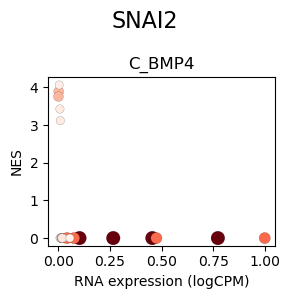

In [60]:
TF = 'SNAI2'
# Create a 1x3 grid of subplots using GridSpec for basal media
fig = plt.figure(figsize=(12, 4))  # Adjust the figure size as needed
gs = plt.GridSpec(1, 3, width_ratios=[1, 1, 1], height_ratios=[1])


# Create a 2x3 grid of subplots using GridSpec for morphogens
fig = plt.figure(figsize=(3, 3))  # Adjust the figure size as needed
gs = plt.GridSpec(1, 1)

morph_cols_plot = ['C_BMP4']
l = 0
# Create scatterplots in each subplot
for i in range(1):
    for j in range(1):
        ax = plt.subplot(gs[i, j])
        morph_plot = morph_cols_plot[l]
        l+=1
        tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==TF]
        x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']
        dot_size = tf_me_summary_gene[morph_plot]
        ax.scatter(x,y,c=dot_size,s=(5+dot_size*10)*10,linewidths=0.1,edgecolors='k',cmap='Reds')
        ax.set_xlabel('RNA expression (logCPM)')
        ax.set_ylabel('NES')
        ax.set_title(morph_plot)
plt.suptitle(TF, fontsize=16)
plt.tight_layout()  # Ensures proper spacing between subplots
plt.savefig("figures/TF_ME_EXPR_"+TF+"_BMP4_morphogens.pdf",dpi=350)
plt.show()
plt.close()


<Figure size 1200x400 with 0 Axes>

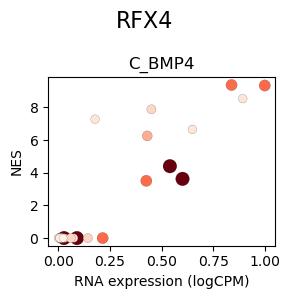

In [61]:
TF = 'RFX4'
# Create a 1x3 grid of subplots using GridSpec for basal media
fig = plt.figure(figsize=(12, 4))  # Adjust the figure size as needed
gs = plt.GridSpec(1, 3, width_ratios=[1, 1, 1], height_ratios=[1])


# Create a 2x3 grid of subplots using GridSpec for morphogens
fig = plt.figure(figsize=(3, 3))  # Adjust the figure size as needed
gs = plt.GridSpec(1, 1)

morph_cols_plot = ['C_BMP4']
l = 0
# Create scatterplots in each subplot
for i in range(1):
    for j in range(1):
        ax = plt.subplot(gs[i, j])
        morph_plot = morph_cols_plot[l]
        l+=1
        tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==TF]
        x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']
        dot_size = tf_me_summary_gene[morph_plot]
        ax.scatter(x,y,c=dot_size,s=(5+dot_size*10)*10,linewidths=0.1,edgecolors='k',cmap='Reds')
        ax.set_xlabel('RNA expression (logCPM)')
        ax.set_ylabel('NES')
        ax.set_title(morph_plot)
plt.suptitle(TF, fontsize=16)
plt.tight_layout()  # Ensures proper spacing between subplots
plt.savefig("figures/TF_ME_EXPR_"+TF+"_BMP4_morphogens.pdf",dpi=350)
plt.show()
plt.close()


<Figure size 1200x400 with 0 Axes>

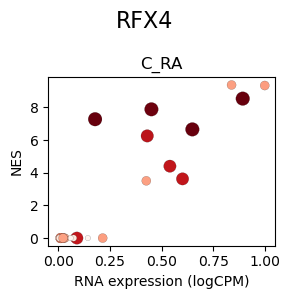

In [62]:
TF = 'RFX4'
# Create a 1x3 grid of subplots using GridSpec for basal media
fig = plt.figure(figsize=(12, 4))  # Adjust the figure size as needed
gs = plt.GridSpec(1, 3, width_ratios=[1, 1, 1], height_ratios=[1])


# Create a 2x3 grid of subplots using GridSpec for morphogens
fig = plt.figure(figsize=(3, 3))  # Adjust the figure size as needed
gs = plt.GridSpec(1, 1)

morph_cols_plot = ['C_RA']
l = 0
# Create scatterplots in each subplot
for i in range(1):
    for j in range(1):
        ax = plt.subplot(gs[i, j])
        morph_plot = morph_cols_plot[l]
        l+=1
        tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==TF]
        x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']
        dot_size = tf_me_summary_gene[morph_plot]
        ax.scatter(x,y,c=dot_size,s=(5+dot_size*10)*10,linewidths=0.1,edgecolors='k',cmap='Reds')
        ax.set_xlabel('RNA expression (logCPM)')
        ax.set_ylabel('NES')
        ax.set_title(morph_plot)
plt.suptitle(TF, fontsize=16)
plt.tight_layout()  # Ensures proper spacing between subplots
plt.savefig("figures/TF_ME_EXPR_"+TF+"_RA_morphogens.pdf",dpi=350)
plt.show()
plt.close()


<Figure size 1200x400 with 0 Axes>

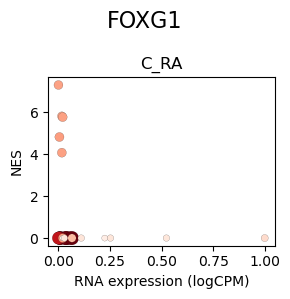

In [63]:
TF = 'FOXG1'
# Create a 1x3 grid of subplots using GridSpec for basal media
fig = plt.figure(figsize=(12, 4))  # Adjust the figure size as needed
gs = plt.GridSpec(1, 3, width_ratios=[1, 1, 1], height_ratios=[1])


# Create a 2x3 grid of subplots using GridSpec for morphogens
fig = plt.figure(figsize=(3, 3))  # Adjust the figure size as needed
gs = plt.GridSpec(1, 1)

morph_cols_plot = ['C_RA']
l = 0
# Create scatterplots in each subplot
for i in range(1):
    for j in range(1):
        ax = plt.subplot(gs[i, j])
        morph_plot = morph_cols_plot[l]
        l+=1
        tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==TF]
        x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']
        dot_size = tf_me_summary_gene[morph_plot]
        ax.scatter(x,y,c=dot_size,s=(5+dot_size*10)*10,linewidths=0.1,edgecolors='k',cmap='Reds')
        ax.set_xlabel('RNA expression (logCPM)')
        ax.set_ylabel('NES')
        ax.set_title(morph_plot)
plt.suptitle(TF, fontsize=16)
plt.tight_layout()  # Ensures proper spacing between subplots
plt.savefig("figures/TF_ME_EXPR_"+TF+"_RA_morphogens.pdf",dpi=350)
plt.show()
plt.close()


<Figure size 1200x400 with 0 Axes>

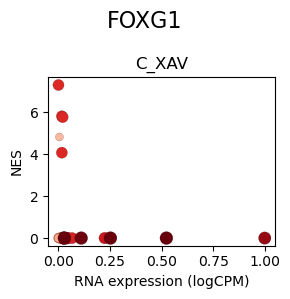

In [64]:
TF = 'FOXG1'
# Create a 1x3 grid of subplots using GridSpec for basal media
fig = plt.figure(figsize=(12, 4))  # Adjust the figure size as needed
gs = plt.GridSpec(1, 3, width_ratios=[1, 1, 1], height_ratios=[1])


# Create a 2x3 grid of subplots using GridSpec for morphogens
fig = plt.figure(figsize=(3, 3))  # Adjust the figure size as needed
gs = plt.GridSpec(1, 1)

morph_cols_plot = ['C_XAV']
l = 0
# Create scatterplots in each subplot
for i in range(1):
    for j in range(1):
        ax = plt.subplot(gs[i, j])
        morph_plot = morph_cols_plot[l]
        l+=1
        tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==TF]
        x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']
        dot_size = tf_me_summary_gene[morph_plot]
        ax.scatter(x,y,c=dot_size,s=(5+dot_size*10)*10,linewidths=0.1,edgecolors='k',cmap='Reds')
        ax.set_xlabel('RNA expression (logCPM)')
        ax.set_ylabel('NES')
        ax.set_title(morph_plot)
plt.suptitle(TF, fontsize=16)
plt.tight_layout()  # Ensures proper spacing between subplots
plt.savefig("figures/TF_ME_EXPR_"+TF+"_XAV_morphogens.pdf",dpi=350)
plt.show()
plt.close()


<Figure size 1200x400 with 0 Axes>

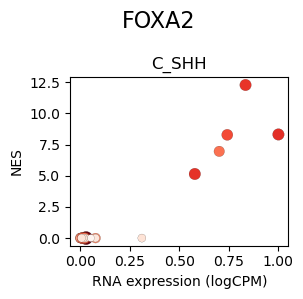

In [66]:
TF = 'FOXA2'
# Create a 1x3 grid of subplots using GridSpec for basal media
fig = plt.figure(figsize=(12, 4))  # Adjust the figure size as needed
gs = plt.GridSpec(1, 3, width_ratios=[1, 1, 1], height_ratios=[1])


# Create a 2x3 grid of subplots using GridSpec for morphogens
fig = plt.figure(figsize=(3, 3))  # Adjust the figure size as needed
gs = plt.GridSpec(1, 1)

morph_cols_plot = ['C_SHH']
l = 0
# Create scatterplots in each subplot
for i in range(1):
    for j in range(1):
        ax = plt.subplot(gs[i, j])
        morph_plot = morph_cols_plot[l]
        l+=1
        tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==TF]
        x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']
        dot_size = tf_me_summary_gene[morph_plot]
        ax.scatter(x,y,c=dot_size,s=(5+dot_size*10)*10,linewidths=0.1,edgecolors='k',cmap='Reds')
        ax.set_xlabel('RNA expression (logCPM)')
        ax.set_ylabel('NES')
        ax.set_title(morph_plot)
plt.suptitle(TF, fontsize=16)
plt.tight_layout()  # Ensures proper spacing between subplots
plt.savefig("figures/TF_ME_EXPR_"+TF+"_SHH_morphogens.pdf",dpi=350)
plt.show()
plt.close()


/links/groups/treutlein/USERS/jjans/anaconda3/envs/scenicplus/lib/python3.8/site-packages/matplotlib/collections.py:1003: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


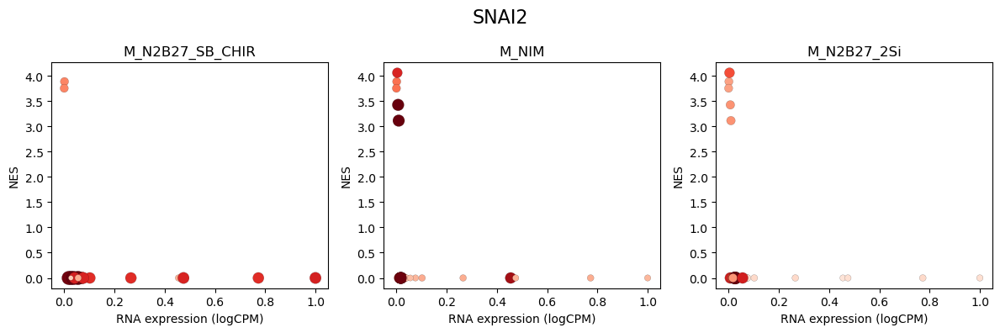

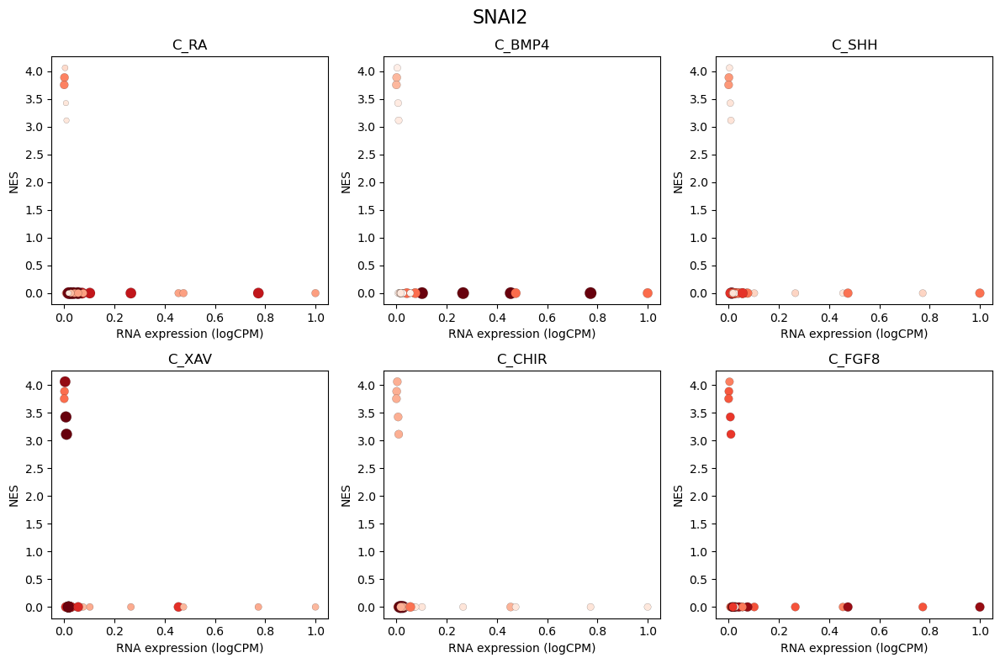

In [51]:
TF = 'SNAI2'
# Create a 1x3 grid of subplots using GridSpec for basal media
fig = plt.figure(figsize=(12, 4))  # Adjust the figure size as needed
gs = plt.GridSpec(1, 3, width_ratios=[1, 1, 1], height_ratios=[1])

morph_cols_plot = ['M_N2B27_SB_CHIR','M_NIM','M_N2B27_2Si']
l = 0
# Create scatterplots in each subplot
for i in range(1):
    for j in range(3):
        ax = plt.subplot(gs[i, j])
        morph_plot = morph_cols_plot[l]
        l+=1
        tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==TF]
        x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']
        dot_size = tf_me_summary_gene[morph_plot]
        ax.scatter(x,y,c=dot_size,s=(5+dot_size*10)*10,linewidths=0.1,edgecolors='k',cmap='Reds')
        ax.set_xlabel('RNA expression (logCPM)')
        ax.set_ylabel('NES')
        ax.set_title(morph_plot)
plt.suptitle(TF, fontsize=16)
plt.tight_layout()  # Ensures proper spacing between subplots
plt.savefig("figures/TF_ME_EXPR_"+TF+"_grid_BM.png",dpi=350,bbox_inches='tight',pad_inches=0)
plt.show()
plt.close()


# Create a 2x3 grid of subplots using GridSpec for morphogens
fig = plt.figure(figsize=(12, 8))  # Adjust the figure size as needed
gs = plt.GridSpec(2, 3, width_ratios=[1, 1, 1], height_ratios=[1, 1])

morph_cols_plot = ['C_RA','C_BMP4','C_SHH','C_XAV','C_CHIR','C_FGF8']
l = 0
# Create scatterplots in each subplot
for i in range(2):
    for j in range(3):
        ax = plt.subplot(gs[i, j])
        morph_plot = morph_cols_plot[l]
        l+=1
        tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==TF]
        x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']
        dot_size = tf_me_summary_gene[morph_plot]
        ax.scatter(x,y,c=dot_size,s=(5+dot_size*10)*10,linewidths=0.1,edgecolors='k',cmap='Reds')
        ax.set_xlabel('RNA expression (logCPM)')
        ax.set_ylabel('NES')
        ax.set_title(morph_plot)
plt.suptitle(TF, fontsize=16)
plt.tight_layout()  # Ensures proper spacing between subplots
plt.savefig("figures/TF_ME_EXPR_"+TF+"_grid_morphogens.png",dpi=350,bbox_inches='tight',pad_inches=0)
plt.show()
plt.close()


/links/groups/treutlein/USERS/jjans/anaconda3/envs/scenicplus/lib/python3.8/site-packages/matplotlib/collections.py:1003: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


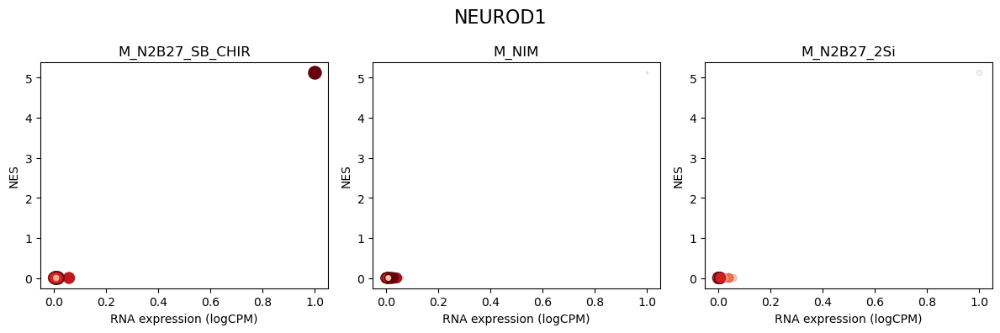

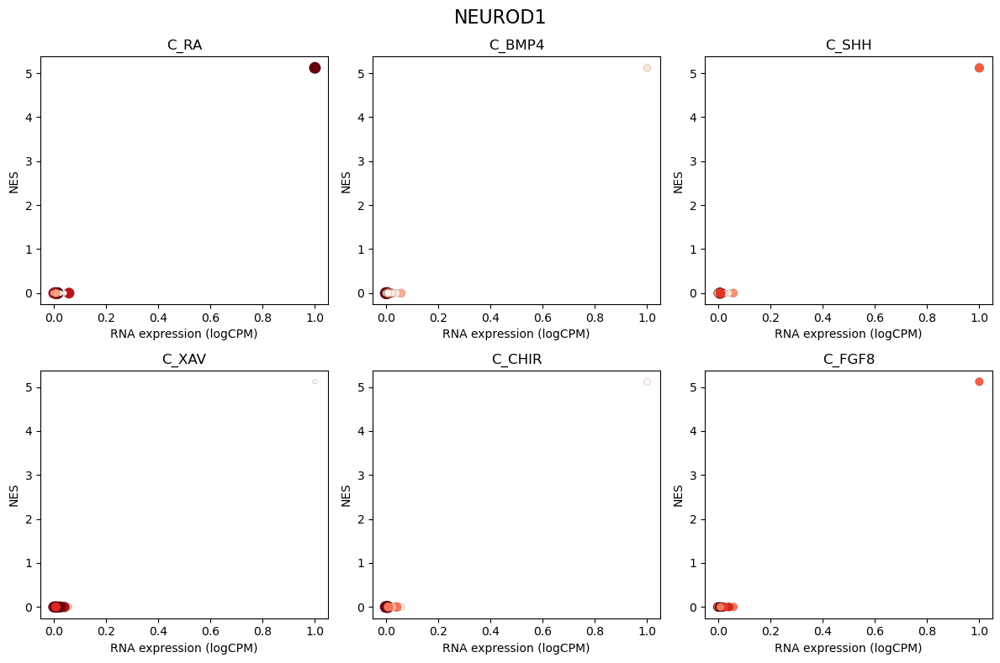

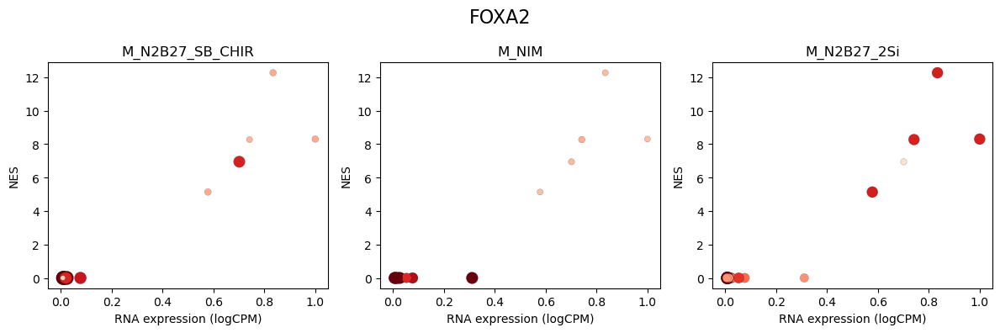

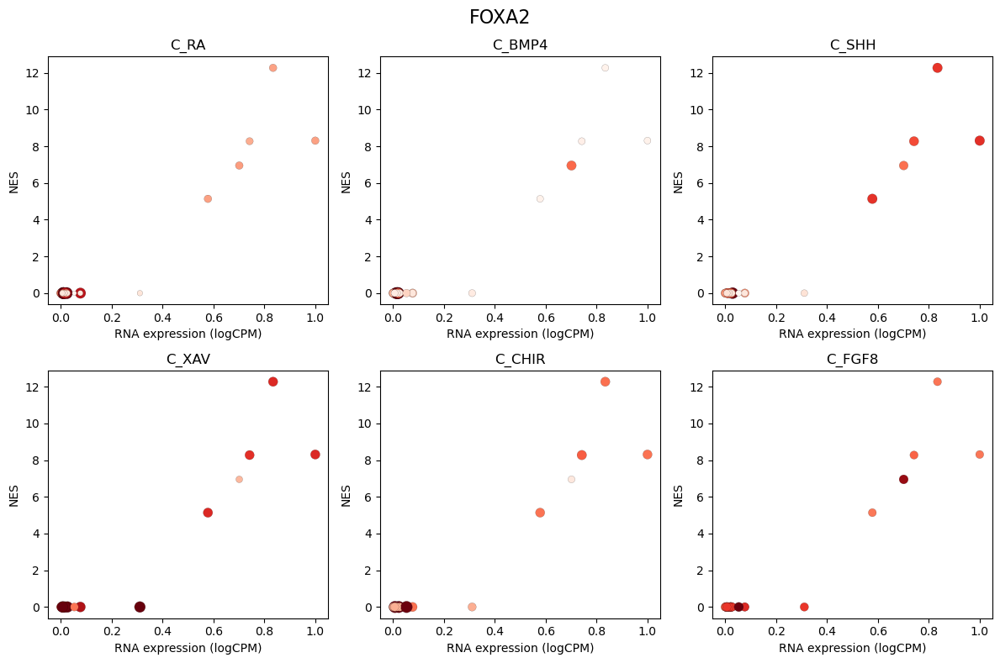

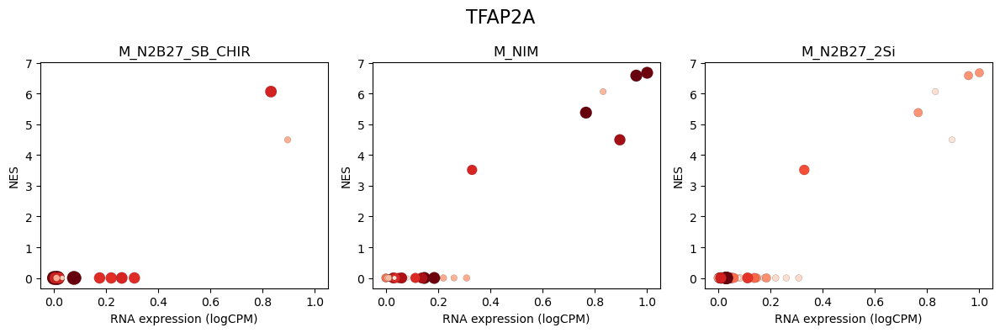

...

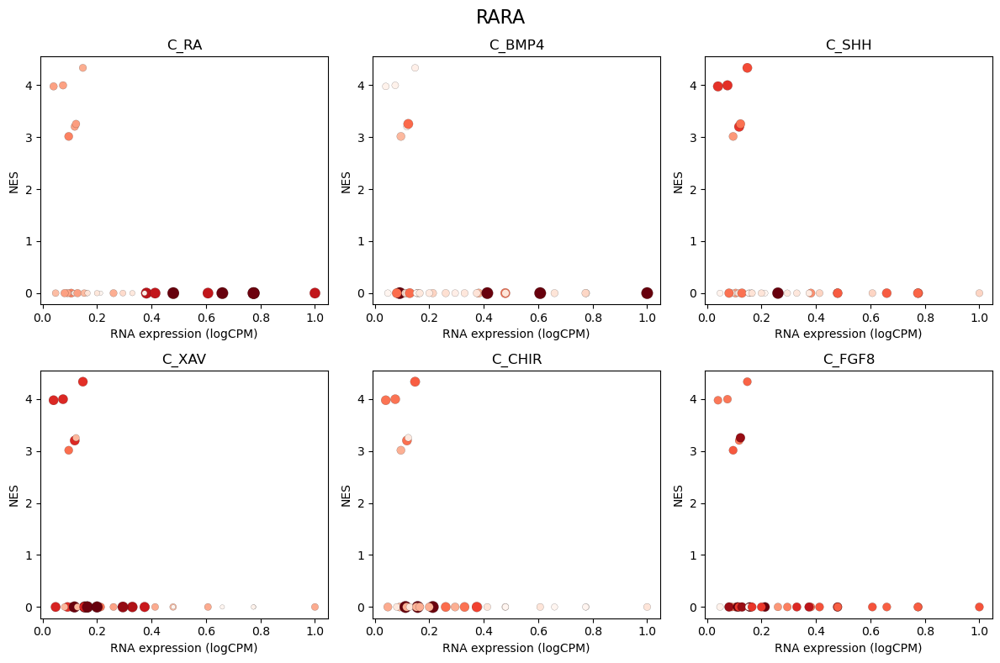

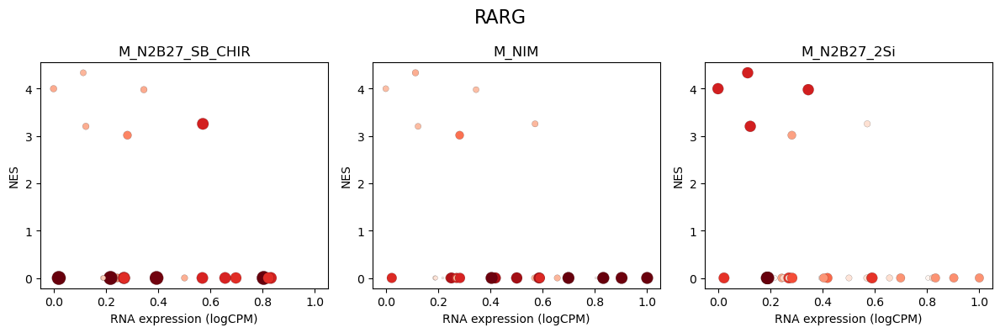

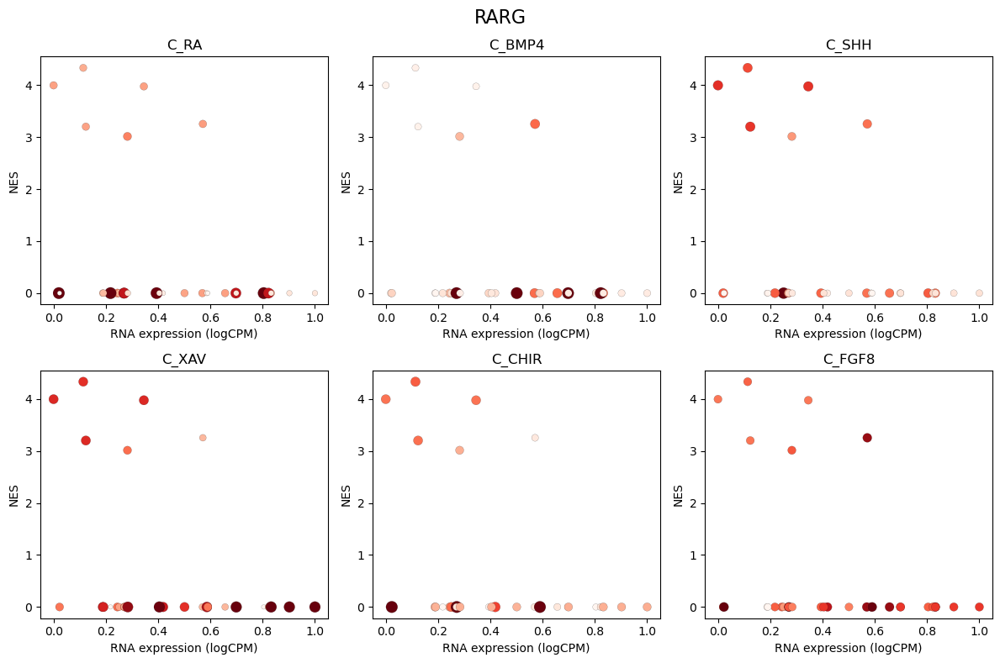

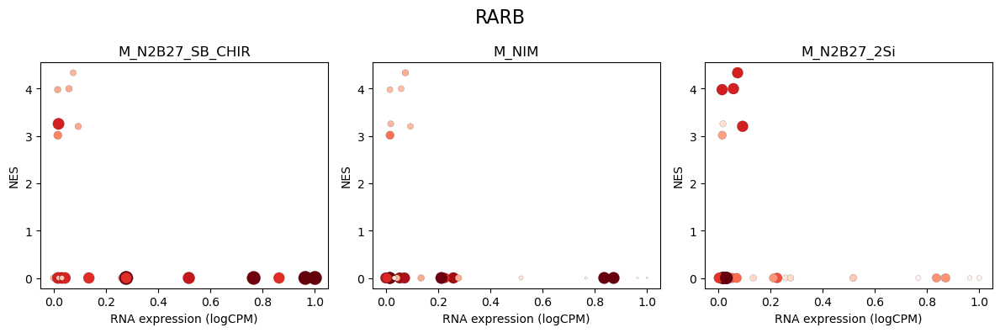

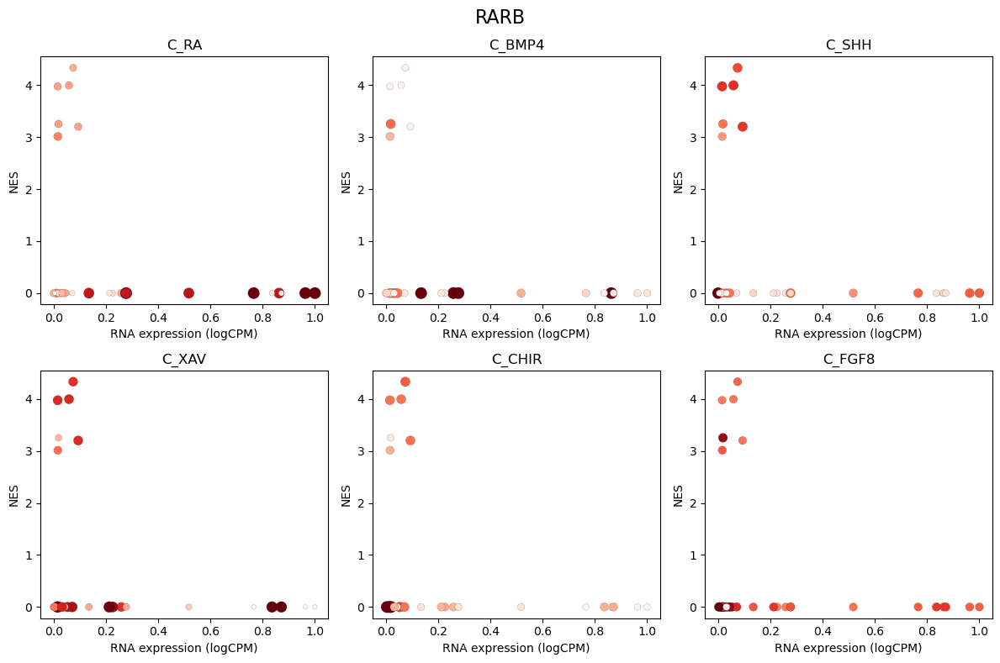

In [268]:
import matplotlib.pyplot as plt
import numpy as np

pos_cor_TFs = list(tf_corr_summary.sort_values(by='r_pearson',ascending=False)['gene'][0:20])
neg_cor_TFs = list(tf_corr_summary.sort_values(by='r_pearson',ascending=True)['gene'][0:20])
SOX_TFs = [x for x in list(set(tf_me_summary['gene'])) if 'SOX' in x]
HOX_TFs = [x for x in list(set(tf_me_summary['gene'])) if 'HOX' in x]
PAX_TFs = [x for x in list(set(tf_me_summary['gene'])) if 'PAX' in x]
SMAD_TFs = [x for x in list(set(tf_me_summary['gene'])) if 'SMAD' in x]
RAR_TFs = [x for x in list(set(tf_me_summary['gene'])) if 'RAR' in x]


# Create some sample data
for TF_list in [pos_cor_TFs,neg_cor_TFs,SOX_TFs,HOX_TFs,PAX_TFs,SMAD_TFs,RAR_TFs]:
    for TF in TF_list:
        # Create a 1x3 grid of subplots using GridSpec for basal media
        fig = plt.figure(figsize=(12, 4))  # Adjust the figure size as needed
        gs = plt.GridSpec(1, 3, width_ratios=[1, 1, 1], height_ratios=[1])

        morph_cols_plot = ['M_N2B27_SB_CHIR','M_NIM','M_N2B27_2Si']
        l = 0
        # Create scatterplots in each subplot
        for i in range(1):
            for j in range(3):
                ax = plt.subplot(gs[i, j])
                morph_plot = morph_cols_plot[l]
                l+=1
                tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==TF]
                x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']
                dot_size = tf_me_summary_gene[morph_plot]
                ax.scatter(x,y,c=dot_size,s=(5+dot_size*10)*10,linewidths=0.1,edgecolors='k',cmap='Reds')
                ax.set_xlabel('RNA expression (logCPM)')
                ax.set_ylabel('NES')
                ax.set_title(morph_plot)
        plt.suptitle(TF, fontsize=16)
        plt.tight_layout()  # Ensures proper spacing between subplots
        plt.savefig("figures/TF_ME_EXPR_"+TF+"_grid_BM.png",dpi=350,bbox_inches='tight',pad_inches=0)
        plt.show()
        plt.close()

        
        # Create a 2x3 grid of subplots using GridSpec for morphogens
        fig = plt.figure(figsize=(12, 8))  # Adjust the figure size as needed
        gs = plt.GridSpec(2, 3, width_ratios=[1, 1, 1], height_ratios=[1, 1])

        morph_cols_plot = ['C_RA','C_BMP4','C_SHH','C_XAV','C_CHIR','C_FGF8']
        l = 0
        # Create scatterplots in each subplot
        for i in range(2):
            for j in range(3):
                ax = plt.subplot(gs[i, j])
                morph_plot = morph_cols_plot[l]
                l+=1
                tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==TF]
                x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']
                dot_size = tf_me_summary_gene[morph_plot]
                ax.scatter(x,y,c=dot_size,s=(5+dot_size*10)*10,linewidths=0.1,edgecolors='k',cmap='Reds')
                ax.set_xlabel('RNA expression (logCPM)')
                ax.set_ylabel('NES')
                ax.set_title(morph_plot)
        plt.suptitle(TF, fontsize=16)
        plt.tight_layout()  # Ensures proper spacing between subplots
        plt.savefig("figures/TF_ME_EXPR_"+TF+"_grid_morphogens.png",dpi=350,bbox_inches='tight',pad_inches=0)
        plt.show()
        plt.close()


In [223]:
list(set(tf_me_summary_gene['gene']))

['HOXB2']

In [224]:
tf_me_summary_gene

,celltype,gene,mnes,TF_motif,rna_expr,C_RA,C_BMP4,C_SHH,M_N2B27_SB_CHIR,M_NIM,M_N2B27_2Si,C_XAV,C_CHIR,C_FGF8
17622,0,HOXB2,0.000000,0,0.001746,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000
17623,10,HOXB2,4.747641,metacluster_112.2,0.012805,-0.000522,-0.000091,-0.000340,-0.000879,0.000309,0.000477,-0.000027,7.190720e-04,0.000180
17624,11,HOXB2,0.000000,0,0.008746,-0.000929,-0.000161,-0.000605,-0.001563,0.000550,0.000849,-0.000049,1.278772e-03,0.000320
17625,12,HOXB2,0.000000,0,0.392261,-0.000522,-0.000417,0.002001,-0.000974,0.001669,-0.000797,-0.000574,6.694130e-04,-0.000248
17626,13,HOXB2,6.206528,metacluster_112.2,0.037164,-0.000622,-0.000736,-0.000950,-0.001424,-0.001593,0.002867,0.000715,-2.120566e-05,-0.000643
17627,14,HOXB2,0.000000,0,1.000000,0.479561,-0.105643,0.115133,0.883018,-0.469118,-0.320677,-0.351660,-1.959017e-01,-0.004742
17628,15,HOXB2,0.000000,0,0.635993,-0.012377,-0.005758,-0.007204,-0.027786,0.022835,0.002017,0.016489,3.703278e-06,0.001149
17629,16,HOXB2,0.000000,0,0.042334,-0.000788,-0.000932,-0.001204,-0.001805,-0.002019,0.003633,0.000906,-2.687218e-05,-0.000814
17630,17,HOXB2,4.425858,metacluster_118.1,0.597415,-0.000338,-0.000270,0.001294,-0.000630,0.001079,-0.000516,-0.000372,4.330266e-04,-0.000161
17631,18,HOXB2,4.203148,taipale_tf_pairs__HOXB2_PITX1_TAATKRNNNNGGATTA_CAP_repr,0.007468,-0.000132,0.000300,0.000150,0.000892,-0.000411,-0.000387,-0.000315,-2.787068e-04,0.000181


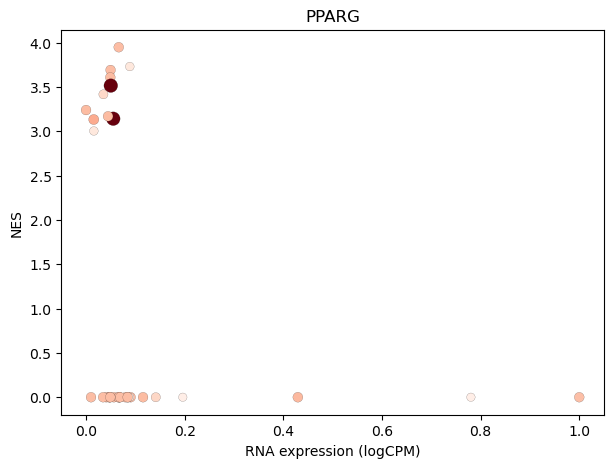

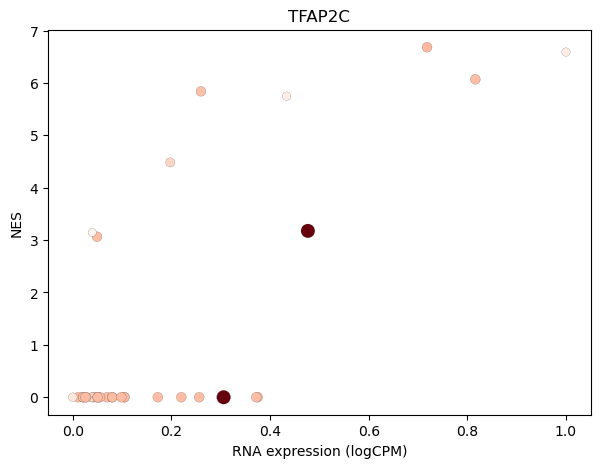

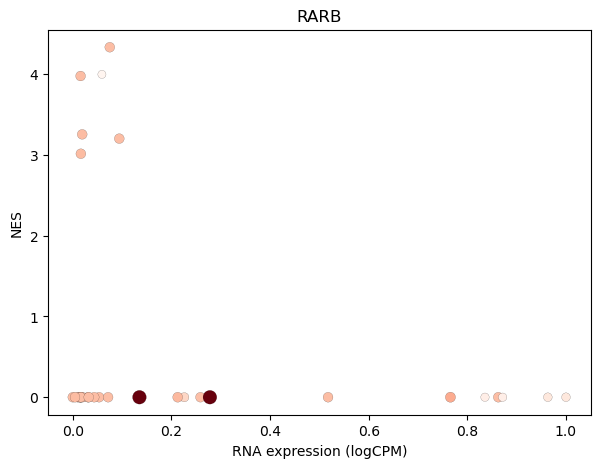

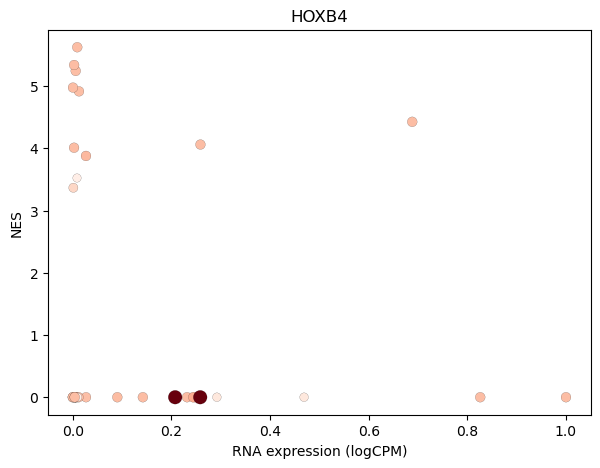

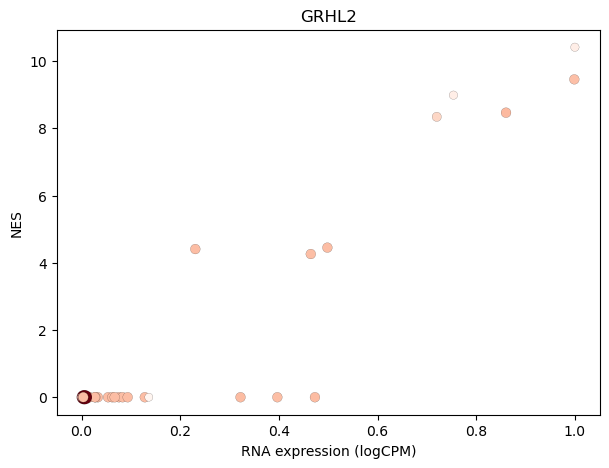

In [201]:
PAX_TFs = ['PPARG','TFAP2C','RARB','HOXB4','GRHL2']
for gene in PAX_TFs:
    tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==gene]
    x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']
    dot_size = tf_me_summary_gene['C_BMP4']
    
    plt.figure(figsize=(7,5))
    plt.scatter(x,y,c=dot_size,s=(5+dot_size*10)*10,linewidths=0.1,edgecolors='k',cmap='Reds')
    plt.title(gene)
    plt.xlabel('RNA expression (logCPM)')
    plt.ylabel('NES')
    plt.savefig('figures/TF_ME_EXPR_'+gene+'_cBMP4.png',dpi=350,bbox_inches='tight',pad_inches=0)
    plt.show()
    plt.close()

In [130]:
import scanpy as sc

In [131]:
adata = sc.read_h5ad("scRNA/adata_clustered_wctrl_harm_cluster_redo.h5ad")

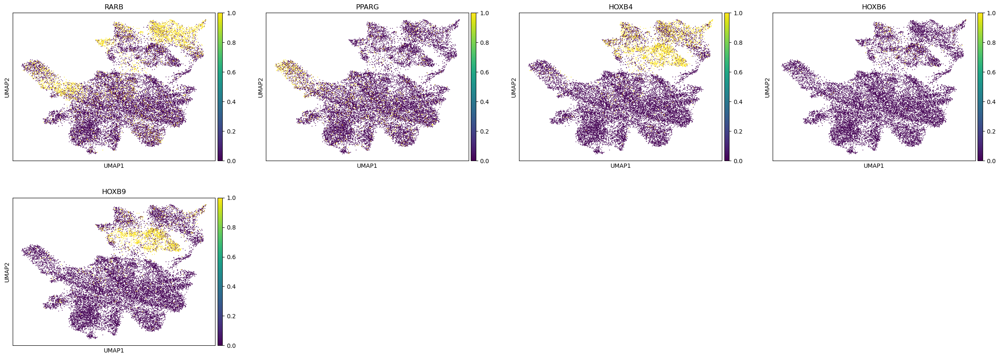

In [151]:
sc.pl.umap(adata,color=['RARB','PPARG','HOXB4','HOXB6','HOXB9'],vmax=1)

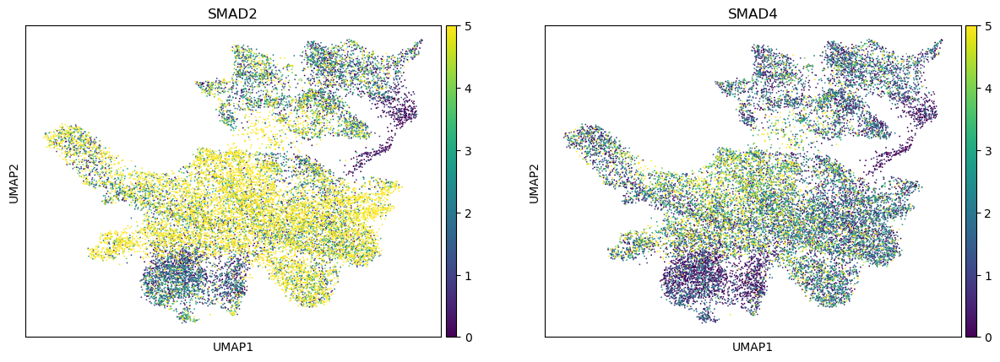

In [149]:
sc.pl.umap(adata,color=['SMAD2','SMAD4'],vmax=5)

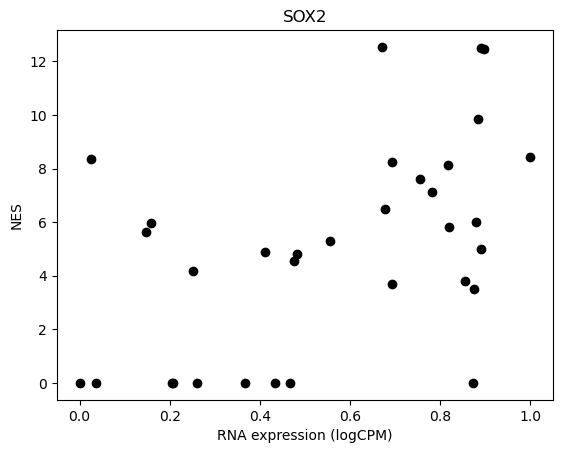

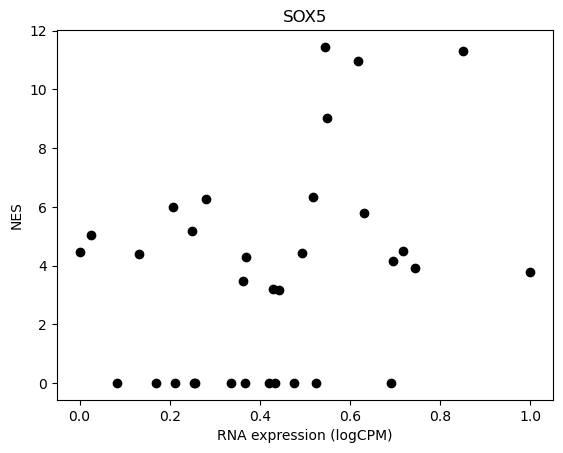

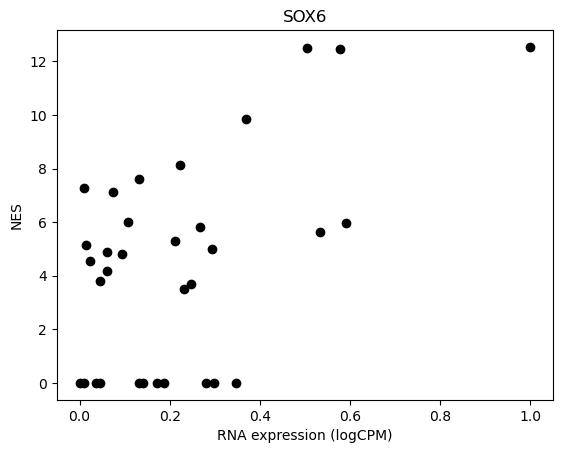

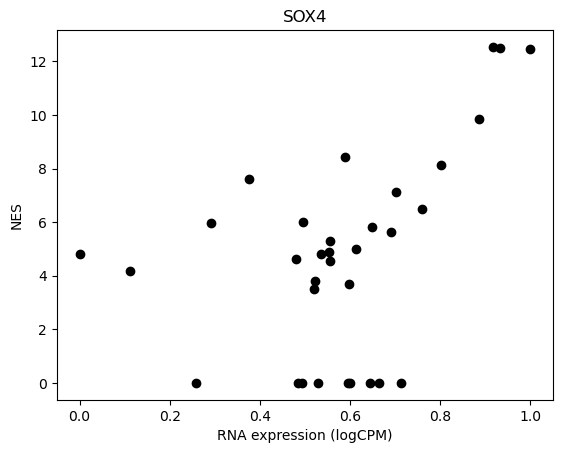

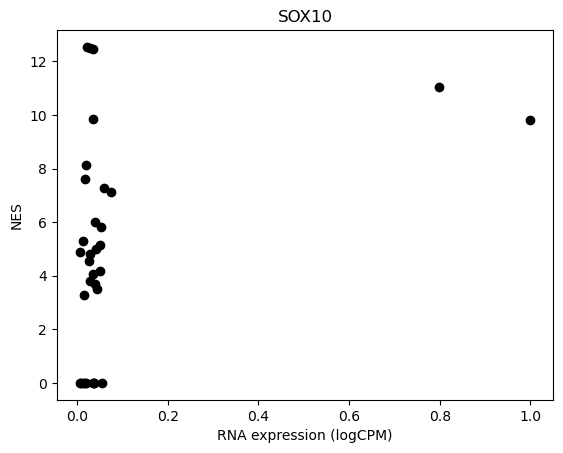

In [60]:
PAX_TFs = ['SOX2','SOX5','SOX6','SOX4','SOX10']
for gene in PAX_TFs:
    tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==gene]
    x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']

    plt.plot(x,y,'o',c='k')
    plt.title(gene)
    plt.xlabel('RNA expression (logCPM)')
    plt.ylabel('NES')
    plt.show()
    plt.close()

['OTX2',
 'VAX1',
 'RFX4',
 'CDX2',
 'GRHL2',
 'HNF1B',
 'TFAP2A',
 'GRHL1',
 'RFX2',
 'HAND1']

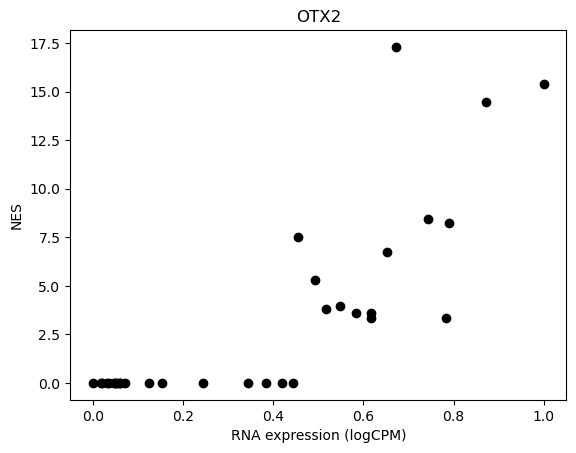

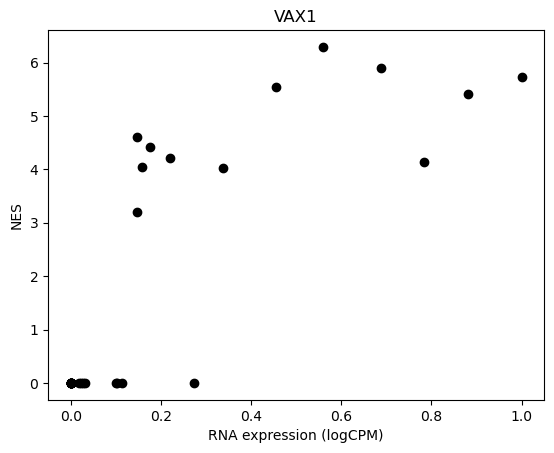

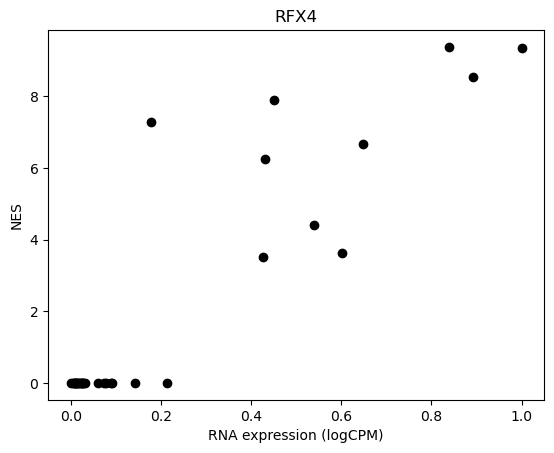

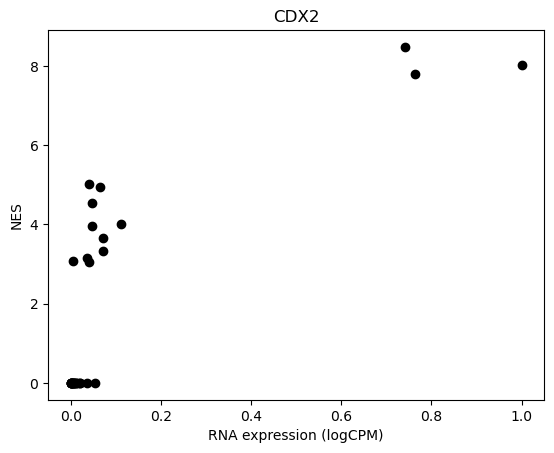

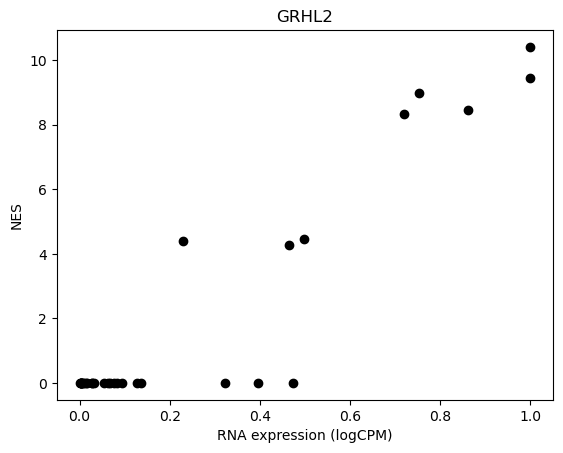

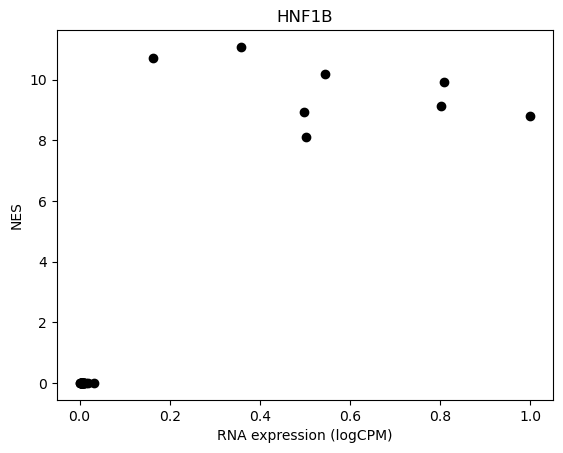

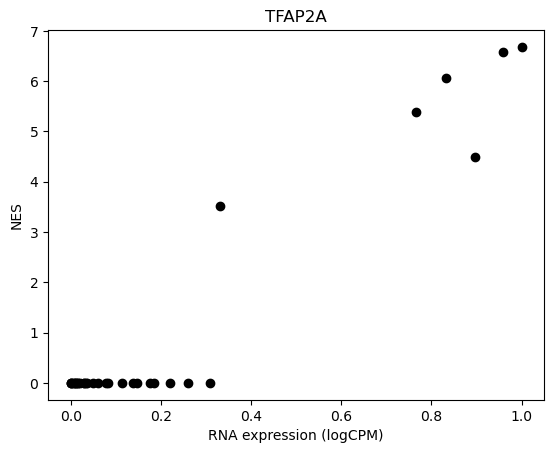

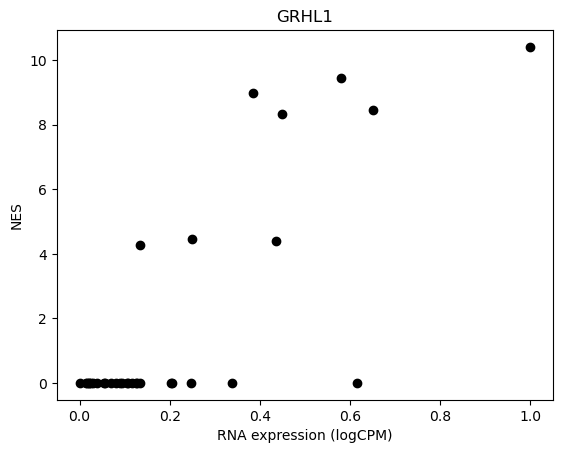

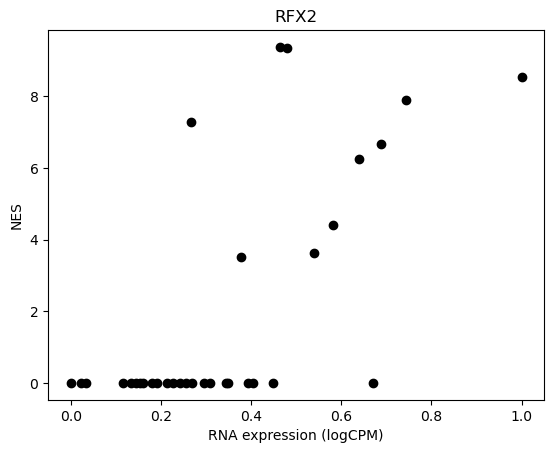

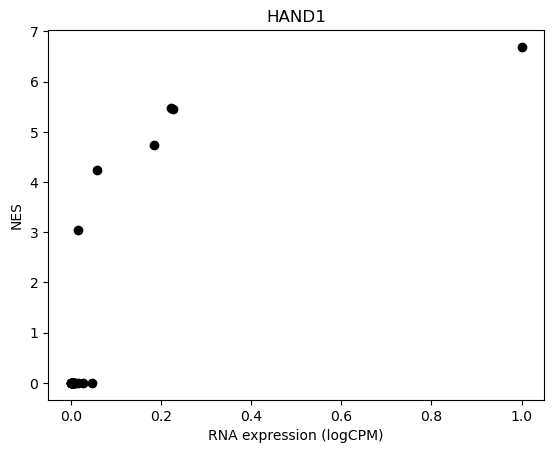

In [62]:
PAX_TFs = pos_corr
for gene in PAX_TFs:
    tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==gene]
    x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']

    plt.plot(x,y,'o',c='k')
    plt.title(gene)
    plt.xlabel('RNA expression (logCPM)')
    plt.ylabel('NES')
    plt.show()
    plt.close()

In [30]:
menr.keys()

dict_keys(['CTX_DARs_All', 'CTX_DARs_No_promoters', 'DEM_DARs_All', 'DEM_DARs_No_promoters'])

In [48]:
NEUROG2_cistromes

[]

In [34]:
region_set_ME['4']

TypeError: 'DEM' object is not subscriptable

In [39]:
menr['CTX_DARs_All']['0'].cistromes['Region_set'].keys()

dict_keys(['ZNF596_(1467r)', 'ZNF740_(1594r)', 'SP8_(2269r)', 'ZNF701_(1467r)', 'POU3F1_(1359r)', 'KLF16_(4075r)', 'SNAI3_(1236r)', 'POU1F1_(195r)', 'POU4F1_(281r)', 'FOS_(206r)', 'HOXD1_(138r)', 'NFE2_(206r)', 'TCF7L1_(138r)', 'KLF12_(2539r)', 'ZNF341_(2104r)', 'KLF10_(3094r)', 'KLF15_(3275r)', 'BACH2_(206r)', 'TCF12_(1236r)', 'ZBTB7B_(2169r)', 'ZNF875_(1467r)', 'FOSL1_(206r)', 'SP2_(3475r)', 'ZNF511_(1439r)', 'EGR2_(2167r)', 'POU3F3_(352r)', 'KLF17_(3319r)', 'ZNF90_(1556r)', 'BCL11A_(206r)', 'POU5F1B_(281r)', 'DPF2_(1467r)', 'ZEB1_(2044r)', 'PBX1_(367r)', 'E2F4_(1594r)', 'ZBTB14_(2129r)', 'E2F1_(148r)', 'YY1_(555r)', 'ZNF311_(1381r)', 'JDP2_(206r)', 'GTF2F1_(1467r)', 'KLF13_(2814r)', 'KLF11_(2595r)', 'HAND2_(1236r)', 'POU2AF1_(281r)', 'PLAG1_(1594r)', 'ZNF526_(1348r)', 'FOSB_(206r)', 'TCF3_(1236r)', 'ZBTB5_(1467r)', 'PRDM9_(2112r)', 'TAF1_(1467r)', 'BATF_(206r)', 'FIGLA_(1236r)', 'POU3F4_(235r)', 'ZNF28_(1594r)', 'NFE2L1_(206r)', 'ZNF460_(1545r)', 'KLF9_(2794r)', 'TBX15_(1494r)', 'MA

In [31]:
cluster26 = menr['CTX_DARs_All']['26']

In [ ]:
['NEUROG2_(2492r']

In [42]:
NEUROG2_regions = cluster26.cistromes['Region_set']['NEUROG2_(2492r)']

In [48]:
lines = [re.sub(":|-","    ",x) for x in lines]
with open('NEUROG2_regions.txt', 'w') as f:
    f.write('\n'.join(lines))

In [45]:
import re

['chr19    11465504    11466004',
 'chr8    10545495    10545995',
 'chr1    185479721    185480221',
 'chr8    119673155    119673655',
 'chr16    85438963    85439463',
 'chr10    110617909    110618409',
 'chr9    130478543    130479043',
 'chr13    30730507    30731007',
 'chr17    32258322    32258822',
 'chr8    40902337    40902837',
 'chr7    27120400    27120900',
 'chrX    18617301    18617801',
 'chr7    72435265    72435765',
 'chr19    29315542    29316042',
 'chr14    59189848    59190348',
 'chr8    64377057    64377557',
 'chr2    43046567    43047067',
 'chr9    100204829    100205329',
 'chr8    41249530    41250030',
 'chr17    57782636    57783136',
 'chr17    50954092    50954592',
 'chr11    122524195    122524695',
 'chr13    33761592    33762092',
 'chr8    48274100    48274600',
 'chr14    24079602    24080102',
 'chr1    178972919    178973419',
 'chrX    40531003    40531503',
 'chr14    83706477    83706977',
 'chr13    79724372    79724872',
 'chr10    6255

In [46]:
lines

['chr19:11465504-11466004',
 'chr8:10545495-10545995',
 'chr1:185479721-185480221',
 'chr8:119673155-119673655',
 'chr16:85438963-85439463',
 'chr10:110617909-110618409',
 'chr9:130478543-130479043',
 'chr13:30730507-30731007',
 'chr17:32258322-32258822',
 'chr8:40902337-40902837',
 'chr7:27120400-27120900',
 'chrX:18617301-18617801',
 'chr7:72435265-72435765',
 'chr19:29315542-29316042',
 'chr14:59189848-59190348',
 'chr8:64377057-64377557',
 'chr2:43046567-43047067',
 'chr9:100204829-100205329',
 'chr8:41249530-41250030',
 'chr17:57782636-57783136',
 'chr17:50954092-50954592',
 'chr11:122524195-122524695',
 'chr13:33761592-33762092',
 'chr8:48274100-48274600',
 'chr14:24079602-24080102',
 'chr1:178972919-178973419',
 'chrX:40531003-40531503',
 'chr14:83706477-83706977',
 'chr13:79724372-79724872',
 'chr10:62554636-62555136',
 'chr7:76216638-76217138',
 'chr4:112897440-112897940',
 'chr15:77554652-77555152',
 'chr11:65301782-65302282',
 'chr2:104584333-104584833',
 'chr10:124676640-12

In [231]:
tf_me_summary_RA = tf_me_summary.loc[tf_me_summary['celltype'].isin(['26','43'])]

In [234]:
tf_me_summary_RA.sort_values(by='mnes',ascending=False).head(n=30)

,celltype,gene,mnes,TF_motif,rna_expr
24054,43,HNF1A,10.186923,metacluster_74.3,0.956975
24101,43,HNF1B,9.941466,metacluster_74.10,0.807392
24035,26,HNF1A,9.137366,metacluster_74.3,0.680414
24082,26,HNF1B,8.791800,metacluster_74.10,1.000000
68234,43,ZBTB7B,8.539398,metacluster_136.3,0.100872
49998,43,RFX5,8.539398,metacluster_136.3,0.168284
35616,43,MXI1,8.539398,metacluster_136.3,0.185628
49810,43,RFX1,8.539398,metacluster_136.3,0.115584
49857,43,RFX2,8.539398,metacluster_136.3,1.000000
56907,43,SREBF1,8.539398,metacluster_136.3,0.367637


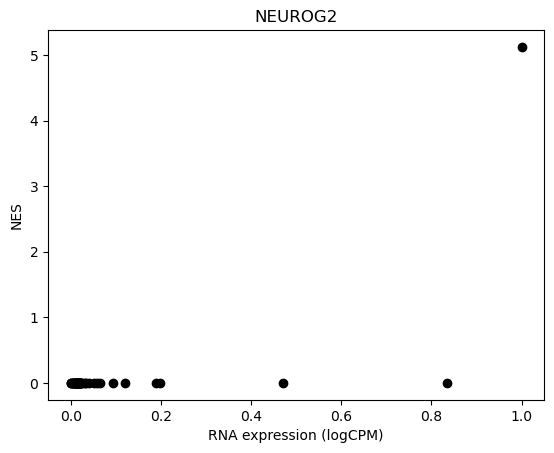

In [23]:
PAX_TFs = ['NEUROG2']
for gene in PAX_TFs:
    tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==gene]
    x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']

    plt.plot(x,y,'o',c='k')
    plt.title(gene)
    plt.xlabel('RNA expression (logCPM)')
    plt.ylabel('NES')
    plt.show()
    plt.close()

In [27]:
cluster_avg_subset_minmax.loc['NEUROG2'].sort_values(ascending=False)

26    1.000000
42    0.833690
32    0.471935
43    0.197348
29    0.188435
8     0.119558
10    0.094447
36    0.065856
30    0.058639
39    0.051236
41    0.041318
22    0.032850
24    0.031328
28    0.027232
12    0.023806
33    0.023801
37    0.021967
2     0.021736
46    0.021303
40    0.019569
47    0.018601
25    0.018095
1     0.017982
14    0.017896
15    0.017316
19    0.016769
23    0.016472
38    0.016388
45    0.016233
4     0.015064
17    0.013836
20    0.012586
16    0.012561
7     0.012453
34    0.012309
35    0.012086
21    0.011216
5     0.010004
3     0.009885
31    0.009025
0     0.008251
9     0.008091
13    0.005840
11    0.005085
44    0.004631
6     0.001123
27    0.000000
18    0.000000
Name: NEUROG2, dtype: float64

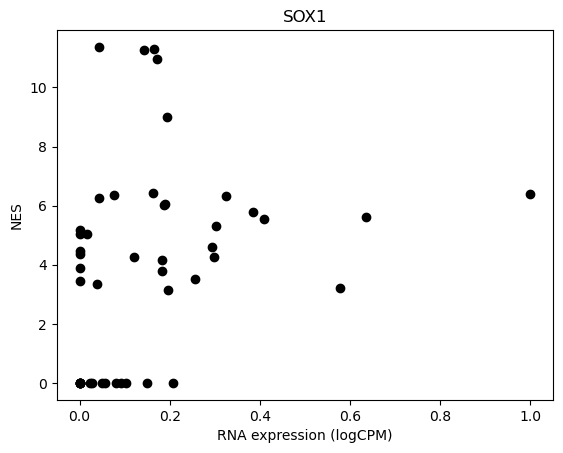

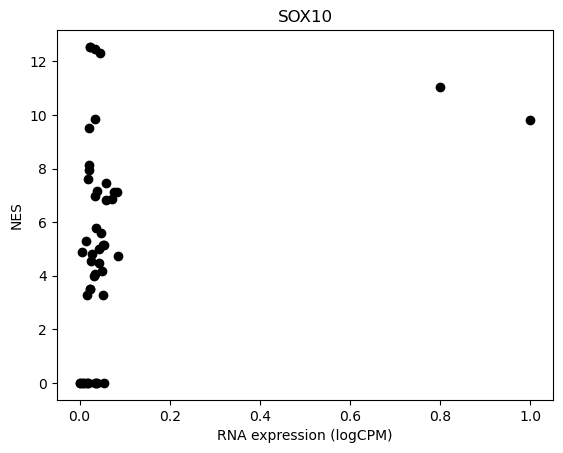

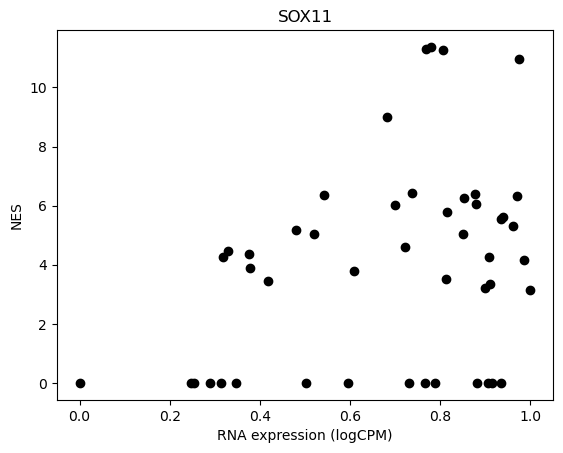

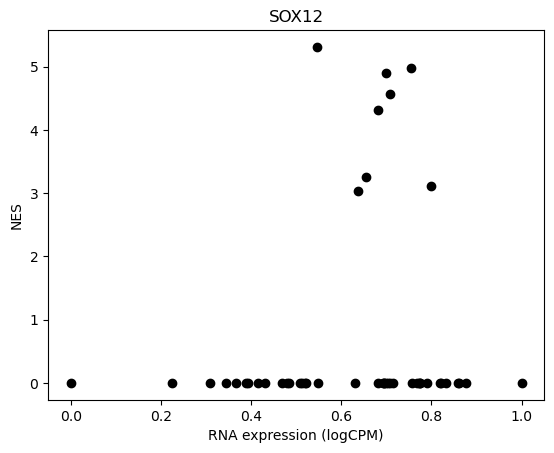

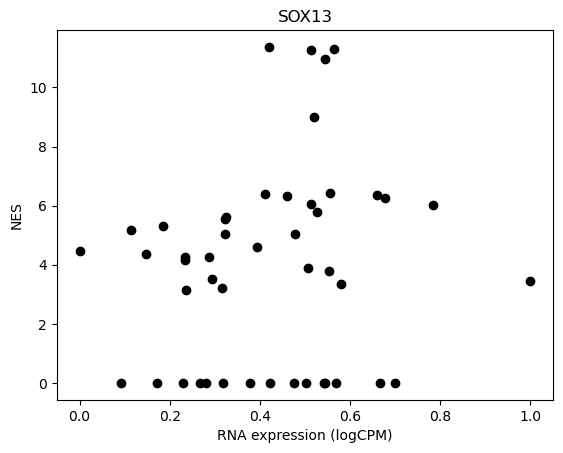

...

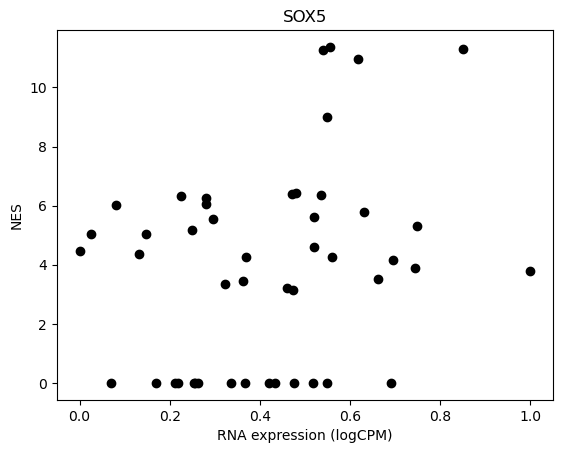

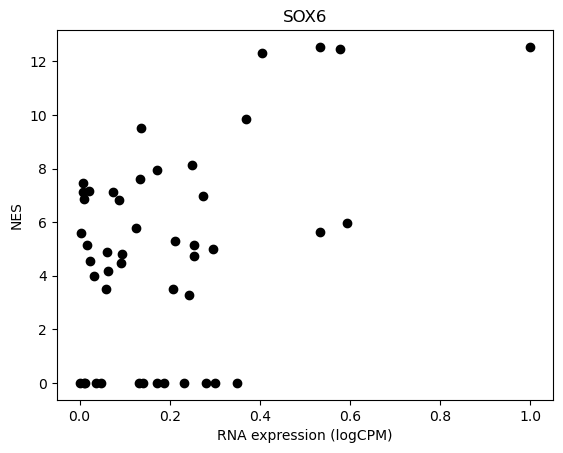

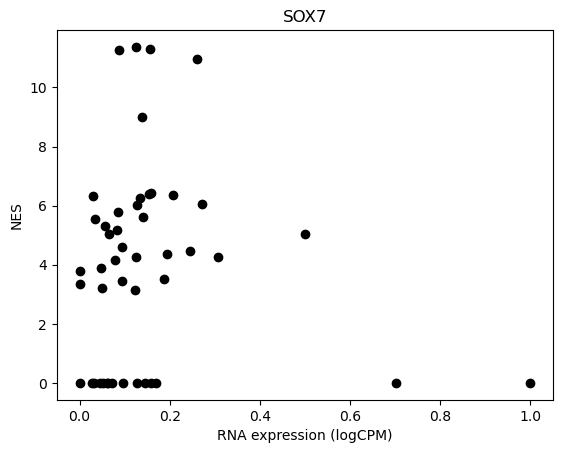

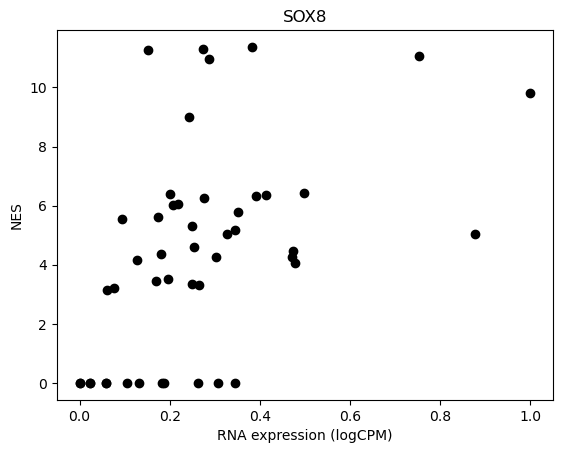

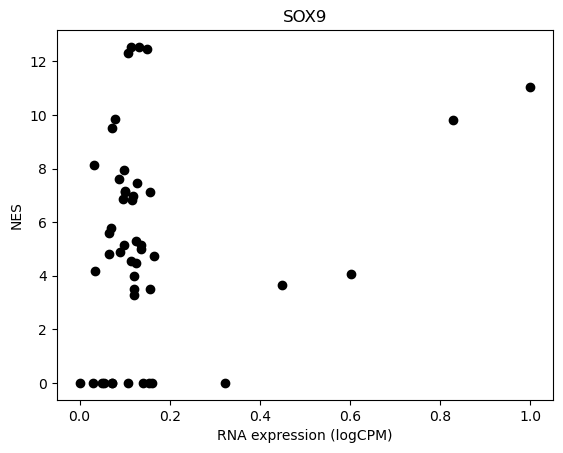

In [226]:
PAX_TFs = [x for x in TFs_use if x.startswith('SOX')]
for gene in PAX_TFs:
    tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==gene]
    x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']

    plt.plot(x,y,'o',c='k')
    plt.title(gene)
    plt.xlabel('RNA expression (logCPM)')
    plt.ylabel('NES')
    plt.show()
    plt.close()

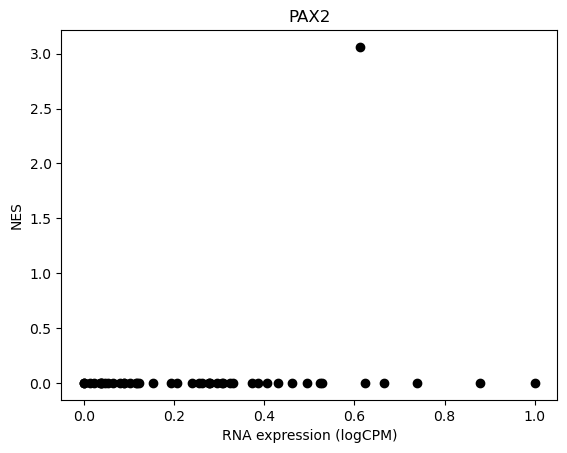

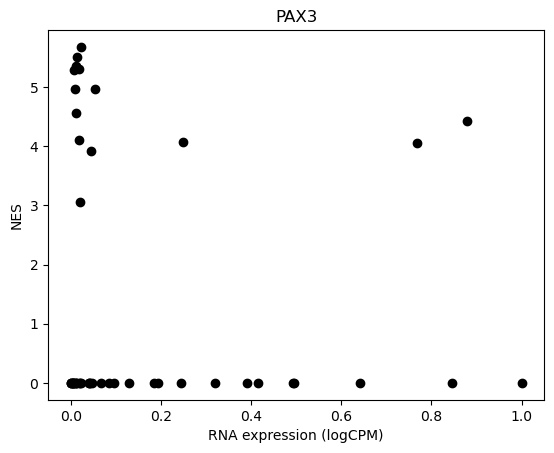

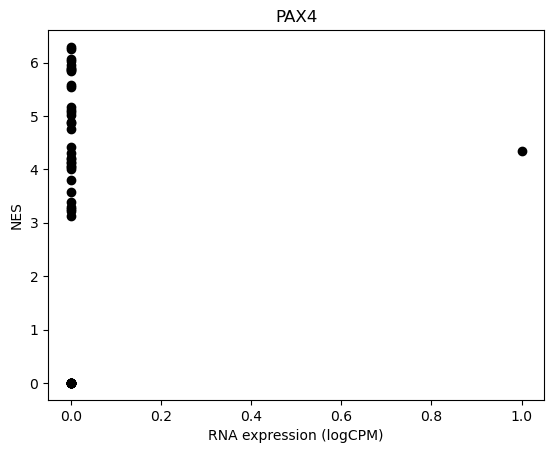

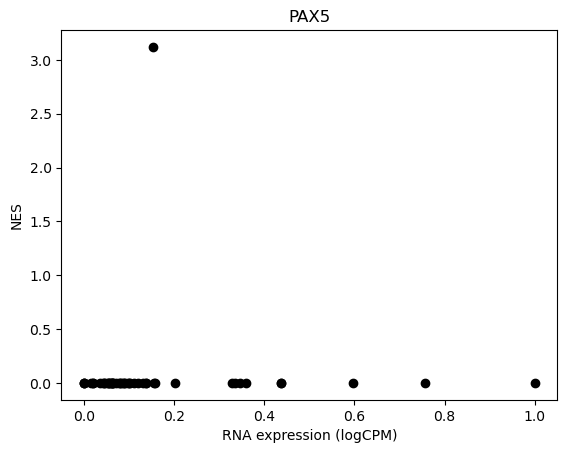

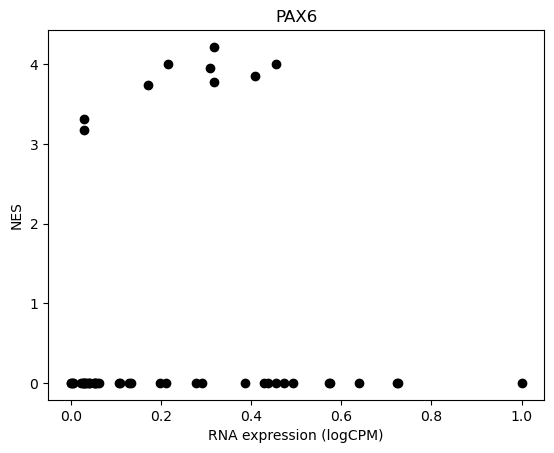

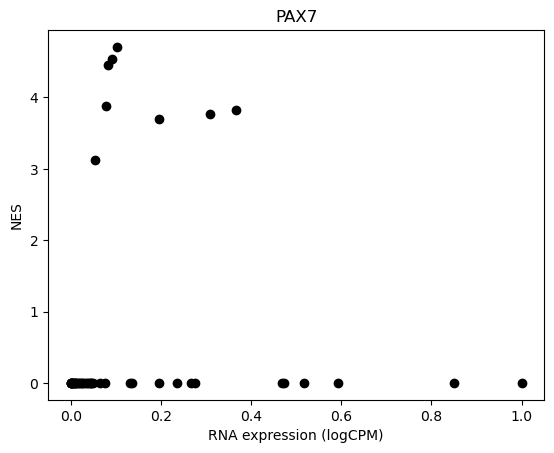

In [225]:
PAX_TFs = [x for x in TFs_use if x.startswith('PAX')]
for gene in PAX_TFs:
    tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==gene]
    x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']

    plt.plot(x,y,'o',c='k')
    plt.title(gene)
    plt.xlabel('RNA expression (logCPM)')
    plt.ylabel('NES')
    plt.show()
    plt.close()

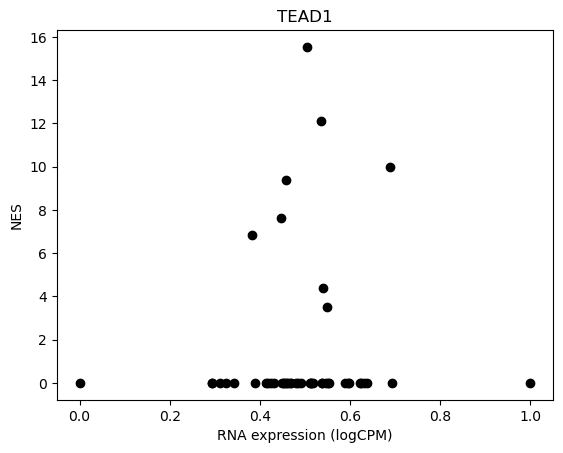

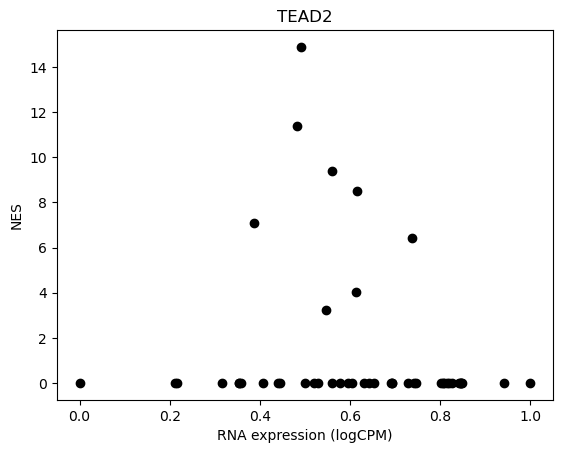

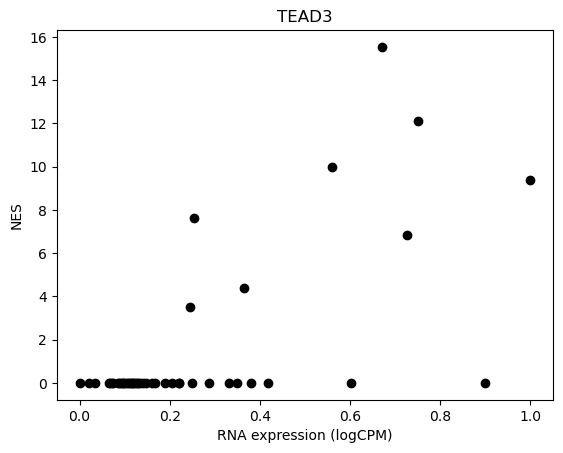

In [221]:
for gene in ['TEAD1','TEAD2','TEAD3']:
    tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==gene]
    x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']

    plt.plot(x,y,'o',c='k')
    plt.title(gene)
    plt.xlabel('RNA expression (logCPM)')
    plt.ylabel('NES')
    plt.show()
    plt.close()

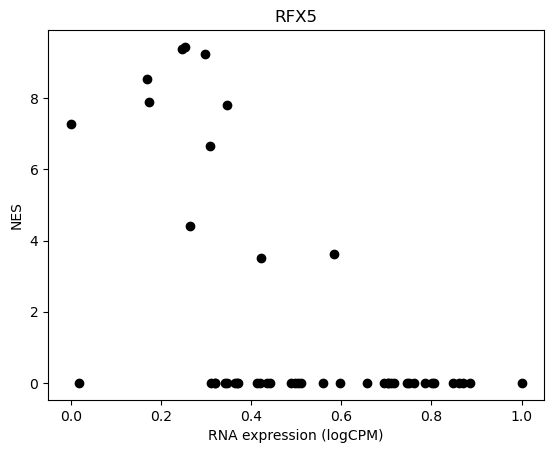

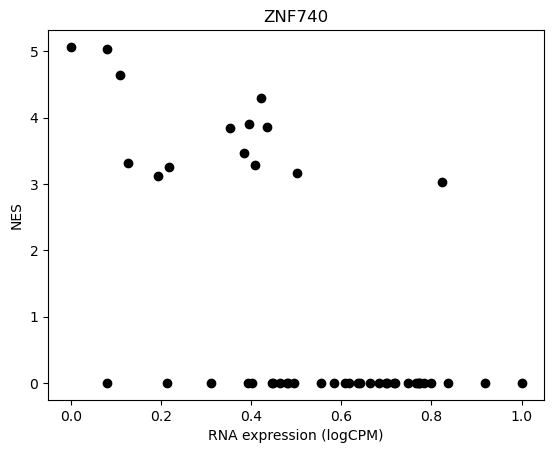

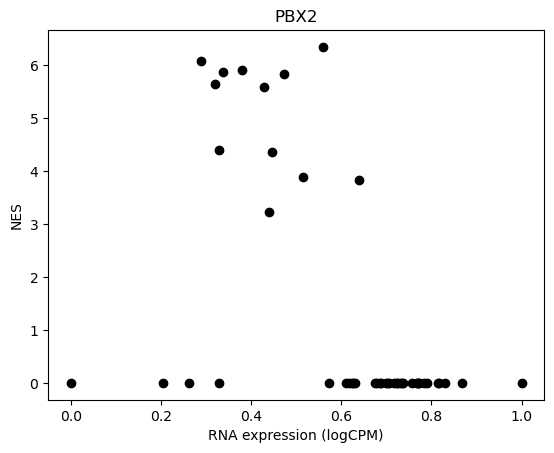

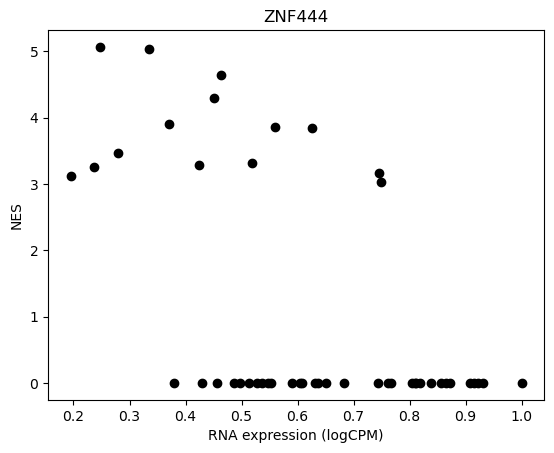

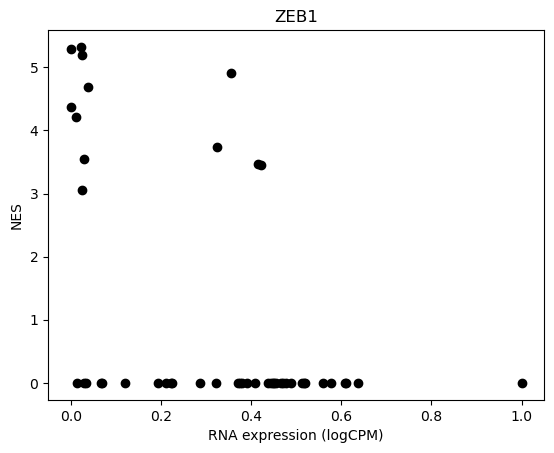

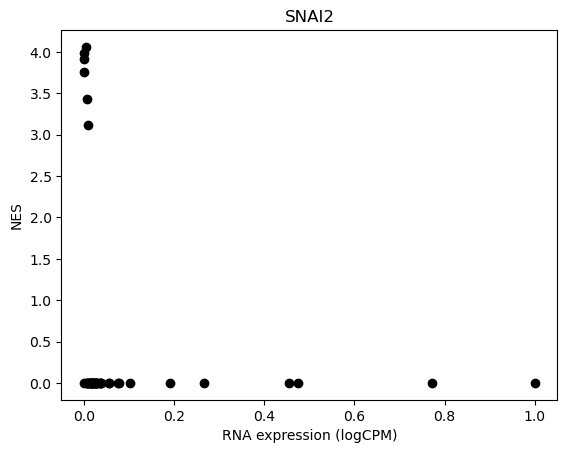

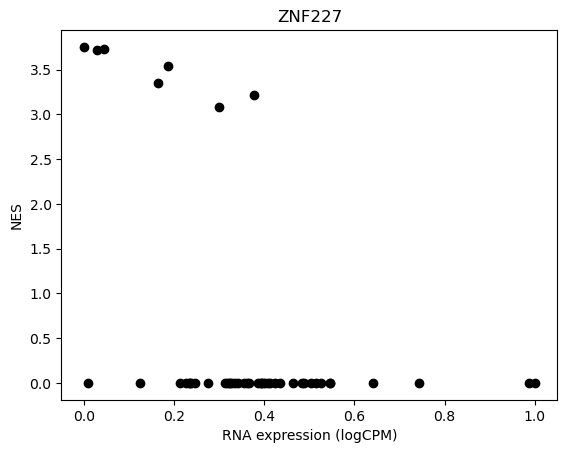

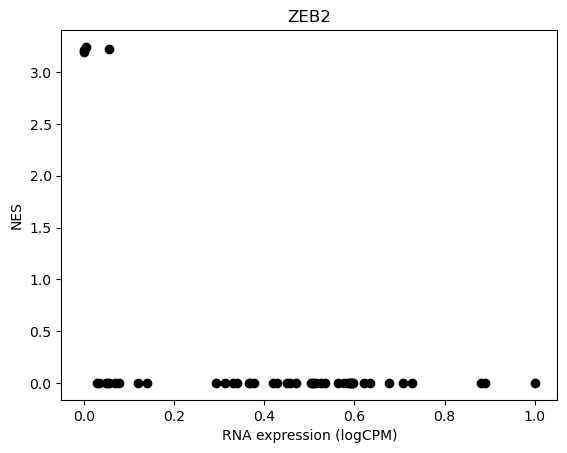

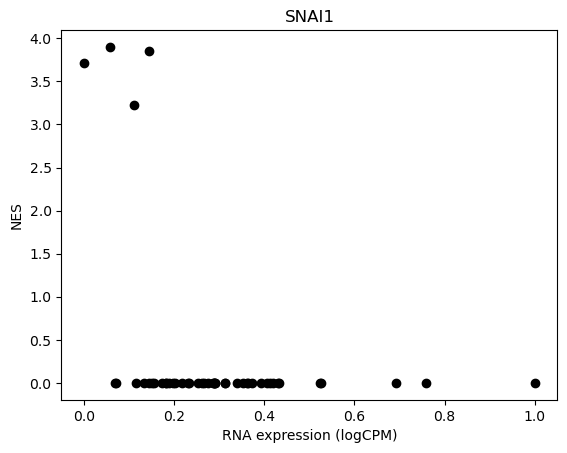

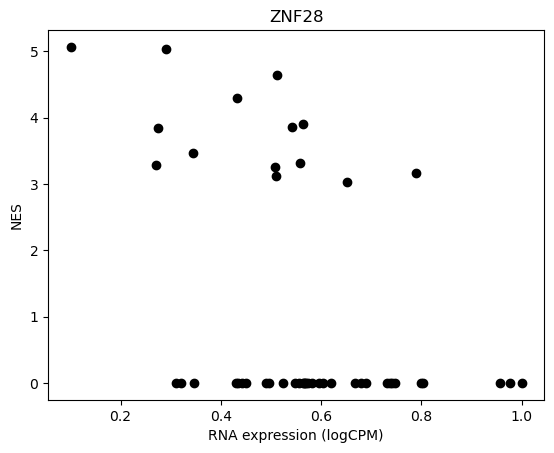

In [222]:
for gene in neg_corr:
    tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==gene]
    x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']

    plt.plot(x,y,'o',c='k')
    plt.title(gene)
    plt.xlabel('RNA expression (logCPM)')
    plt.ylabel('NES')
    plt.show()
    plt.close()

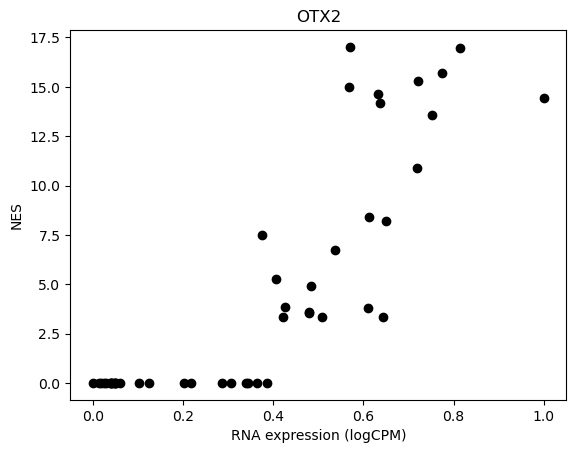

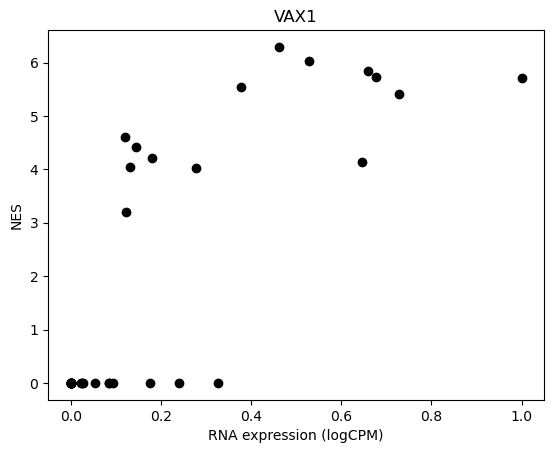

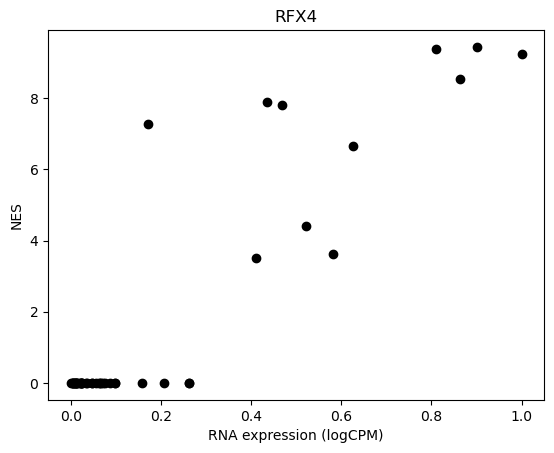

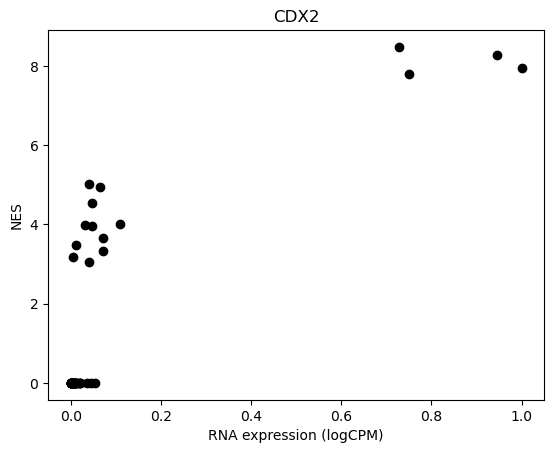

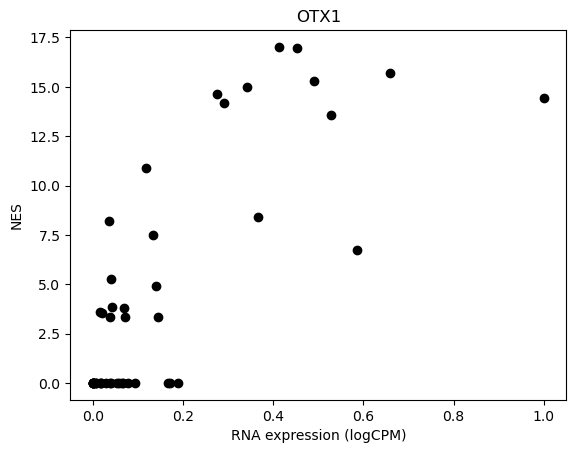

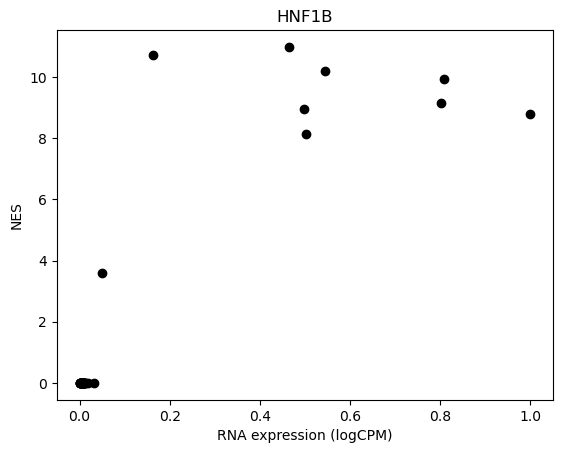

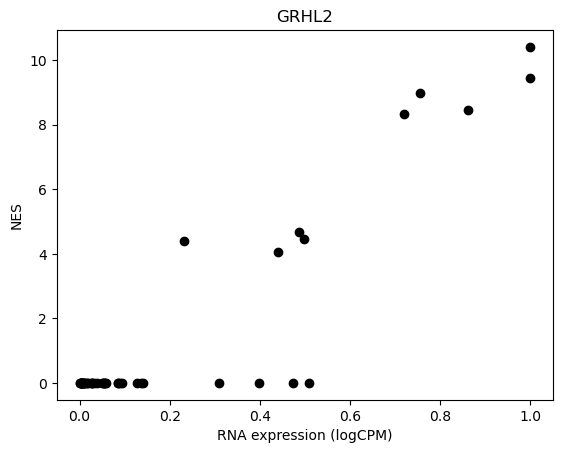

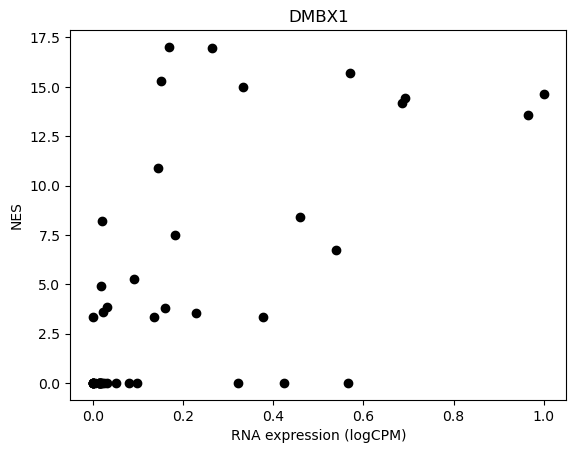

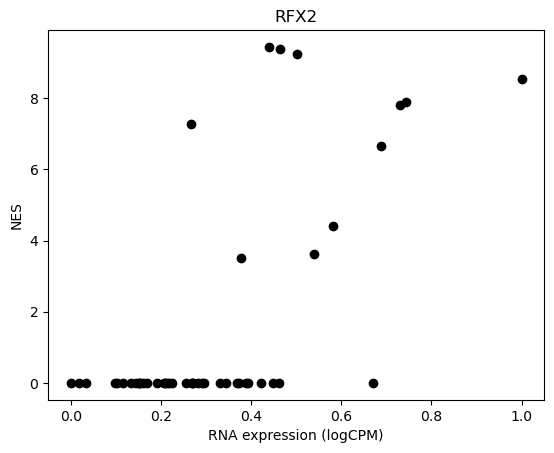

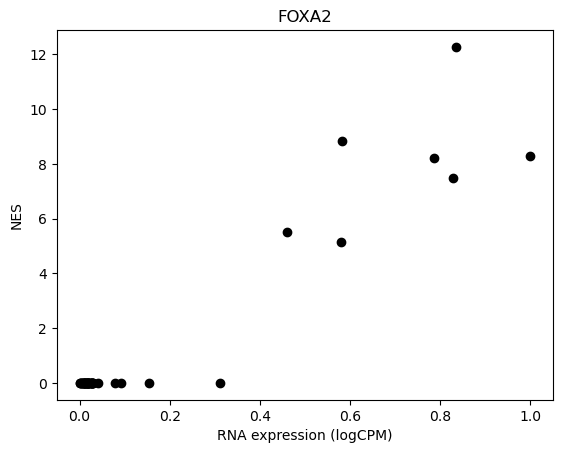

In [223]:
for gene in pos_corr:
    tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==gene]
    x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']

    plt.plot(x,y,'o',c='k')
    plt.title(gene)
    plt.xlabel('RNA expression (logCPM)')
    plt.ylabel('NES')
    plt.show()
    plt.close()

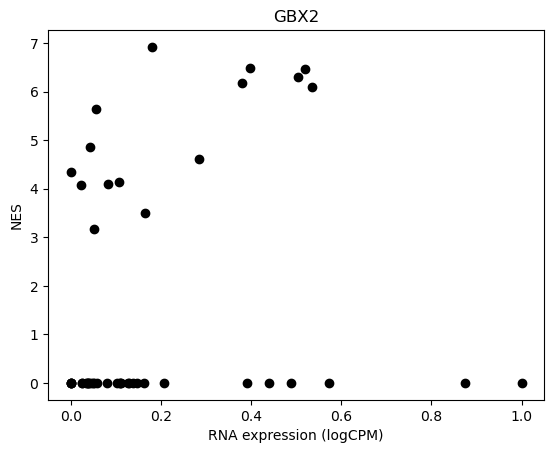

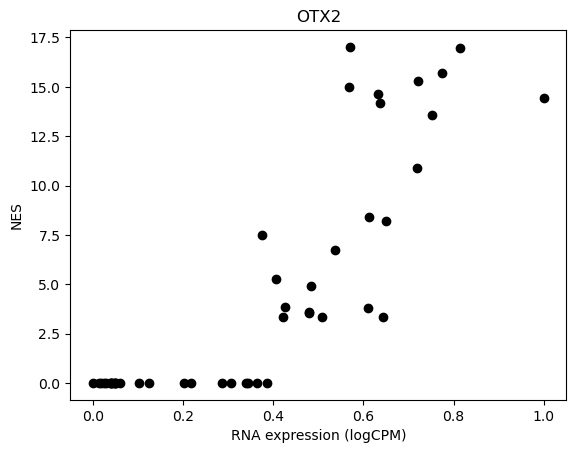

In [260]:
for gene in ['GBX2','OTX2']:
    tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==gene]
    x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']

    plt.plot(x,y,'o',c='k')
    plt.title(gene)
    plt.xlabel('RNA expression (logCPM)')
    plt.ylabel('NES')
    plt.show()
    plt.close()

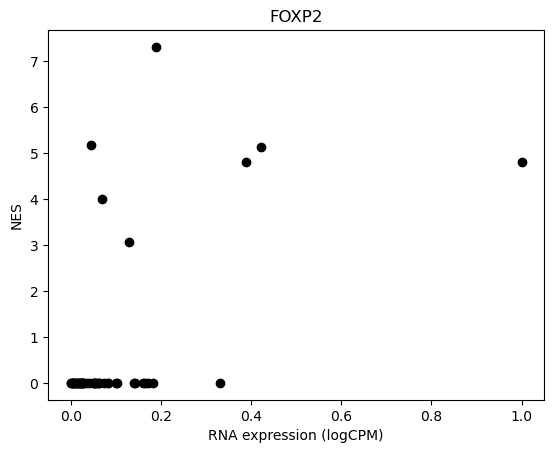

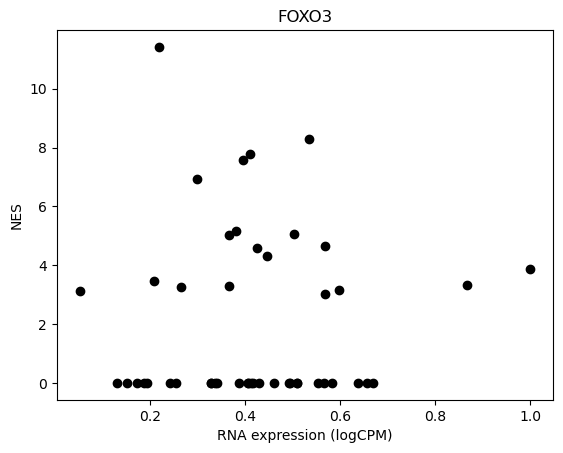

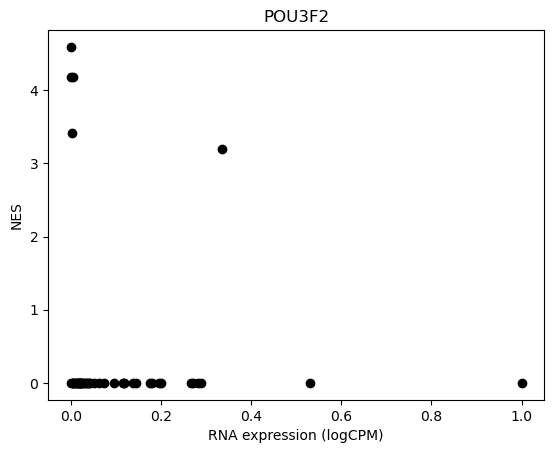

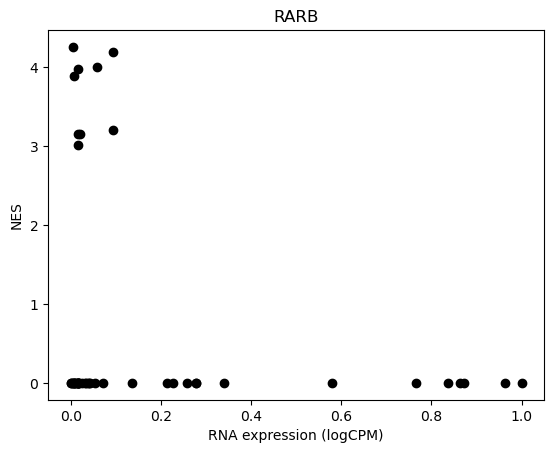

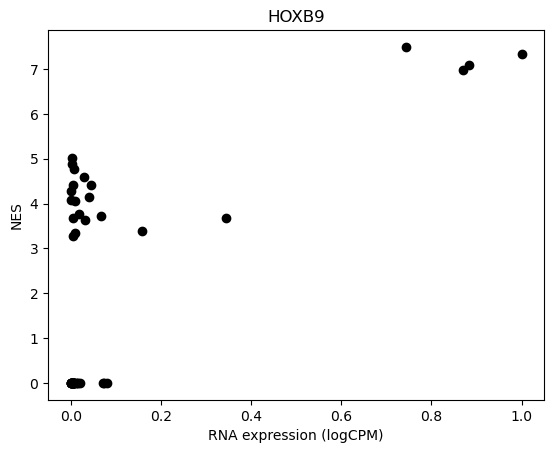

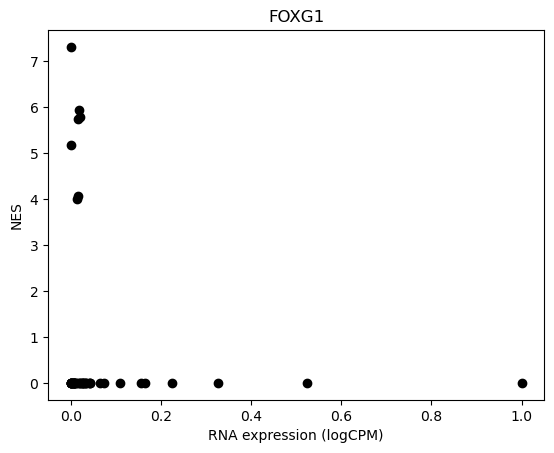

In [259]:
for gene in ['FOXP2','FOXO3','POU3F2','RARB','HOXB9','FOXG1']:
    tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==gene]
    x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']

    plt.plot(x,y,'o',c='k')
    plt.title(gene)
    plt.xlabel('RNA expression (logCPM)')
    plt.ylabel('NES')
    plt.show()
    plt.close()

In [244]:
tf_me_summary_gene

,celltype,gene,mnes,TF_motif,rna_expr
16826,0,FOXG1,0.000000,0,0.013830
16827,1,FOXG1,0.000000,0,0.156838
16828,10,FOXG1,4.003396,transfac_pro__M01216,0.013836
16829,11,FOXG1,0.000000,0,0.012188
16830,12,FOXG1,0.000000,0,0.165869
16831,13,FOXG1,0.000000,0,0.007796
16832,14,FOXG1,0.000000,0,0.325584
16833,15,FOXG1,0.000000,0,0.110312
16834,16,FOXG1,0.000000,0,0.024838
16835,17,FOXG1,0.000000,0,0.027356


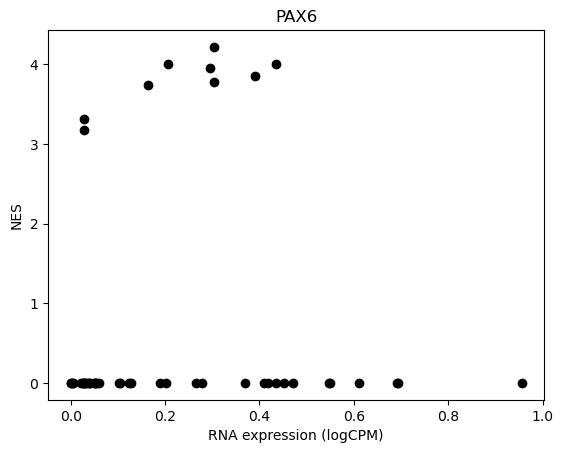

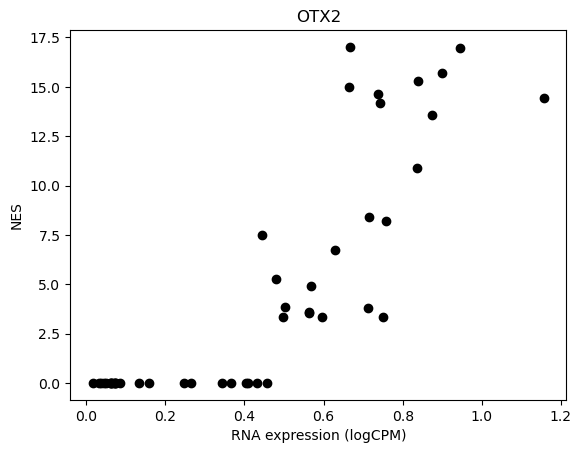

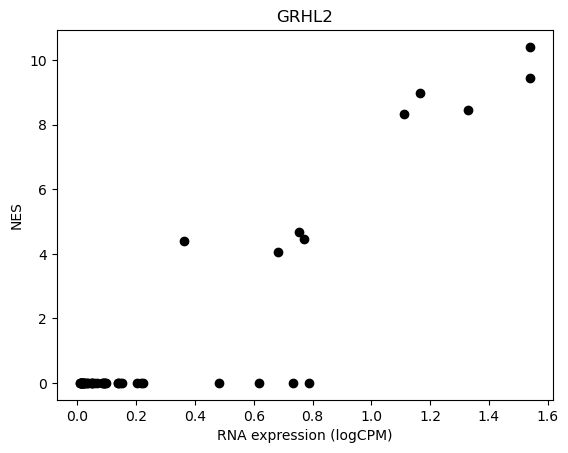

In [81]:
for gene in selected_TFs:
    tf_me_summary_gene = tf_me_summary.loc[tf_me_summary['gene']==gene]
    x,y = tf_me_summary_gene['rna_expr'],tf_me_summary_gene['mnes']

    plt.plot(x,y,'o',c='k')
    plt.title(gene)
    plt.xlabel('RNA expression (logCPM)')
    plt.ylabel('NES')
    plt.show()
    plt.close()

In [75]:
tf_me_summary_gene

,celltype,gene,mnes,rna_expr
0,0,PAX6,0.000000,0.030673
1,1,PAX6,4.005338,0.434699
2,10,PAX6,0.000000,0.026984
3,11,PAX6,0.000000,0.105238
4,12,PAX6,4.007532,0.206201
5,13,PAX6,0.000000,0.369805
6,14,PAX6,3.956959,0.295435
7,15,PAX6,0.000000,0.060427
8,16,PAX6,4.218611,0.303955
9,17,PAX6,0.000000,0.546440


In [35]:
import pandas as pd

# Example DataFrame
df = pd.DataFrame({'Column1': ['A,B,C', 'D,E,F,G', 'H,I']})

# Split the strings into lists
df['Column1'] = df['Column1'].str.split(',')

# Expand the lists into separate columns
df = df['Column1'].apply(pd.Series)

# Rename the columns if needed
df.columns = ['Column2', 'Column3', 'Column4', 'Column5']

# Output the updated DataFrame
print(df)


  Column2 Column3 Column4 Column5
0       A       B       C     NaN
1       D       E       F       G
2       H       I     NaN     NaN


In [37]:
import pandas as pd

# Example DataFrame
df = pd.DataFrame({'Column1': [['A', 'B', 'C'], ['D', 'E', 'F', 'G'], ['H', 'I']]})

# Define the string you want to search for
search_string = 'B'

# Use apply with a lambda function to check if the string is present in each list
filtered_df = df[df['Column1'].apply(lambda x: search_string in x)]

# Output the filtered DataFrame
print(filtered_df)


     Column1
0  [A, B, C]


In [38]:
df

,Column1
0,"[A, B, C]"
1,"[D, E, F, G]"
2,"[H, I]"


In [16]:
cluster_avg_subset.loc['PAX6']

0     0.030673
1     0.434699
10    0.026984
11    0.105238
12    0.206201
13    0.369805
14    0.295435
15    0.060427
16    0.303955
17    0.546440
18    0.162722
19    0.692949
2     0.153654
20    0.955341
21    0.201912
22    0.025804
23    0.127104
24    0.303802
25    0.022753
26    0.611449
27    0.050111
28    0.005107
29    0.418715
3     0.549826
30    0.029091
31    0.000732
32    0.471869
33    0.389484
34    0.039829
35    0.040124
36    0.028066
37    0.690664
38    0.028396
39    0.037549
4     0.124099
40    0.005470
41    0.188341
42    0.409224
43    0.452297
44    0.050643
45    0.102048
46    0.279190
47    0.433932
5     0.266282
6     0.000000
7     0.031929
8     0.056500
9     0.051361
Name: PAX6, dtype: float64